# 1. Librairies

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)
import plotly.express as px
from google.cloud import bigquery
import db_dtypes
import matplotlib.pyplot as plt
#%load_ext bigquery_magics

import os
pd.set_option('display.max_rows', None)
pd.options.display.float_format = '{:.4f}'.format
pd.set_option('display.max_columns', None)  
pd.set_option('display.width', 1000)        
pd.set_option('display.colheader_justify', 'left') 

# -------------- MMM PACKAGES 
from robyn.robyn import Robyn
from robyn.data.entities.mmmdata import MMMData
from robyn.data.entities.holidays_data import HolidaysData
from robyn.data.entities.hyperparameters import Hyperparameters, ChannelHyperparameters
from robyn.data.entities.enums import AdstockType, DependentVarType

# -------------- NSGA3 PACKAGES
from pymoo.indicators.hv import Hypervolume
from pymoo.core.problem import Problem
from pymoo.algorithms.moo.nsga3 import NSGA3
from pymoo.optimize import minimize
from pymoo.operators.sampling.rnd import FloatRandomSampling
from pymoo.operators.crossover.sbx import SBX
from pymoo.operators.mutation.pm import PM # Polynomial Mutation (standard dans pymoo)
from pymoo.operators.mutation.gauss import GM 
from pymoo.util.ref_dirs import get_reference_directions

2026-08-31 09:32:38,199 - robyn - INFO - Logging is set up to console only.
/home/user/mmm_influencers/robyn-venv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Data extraction from BigQuery

In [2]:
CACHE_FILE = "full_posts_data_4.pkl"
def get_posts_data(force_refresh=False):
    """
    Fetches weekly kpis perf data from BigQuery.
    If cache exists, loads from cache unless force_refresh=True
    """
    if os.path.exists(CACHE_FILE) and not force_refresh:
        print("Loading data from cache...")
        df = pd.read_pickle(CACHE_FILE)
    else:
        print("Fetching data from BigQuery...")
        client = bigquery.Client(project=project_id)
        with open("/home/user/mmm_influencers/source_documents/full_posts.sql") as f:
            query = f.read()
        df = client.query(query).to_dataframe()
        df.to_pickle(CACHE_FILE)  # cache it locally
    return df

In [3]:
project_id = 'emea-dataexzone-gbl-emea-pd'

client = bigquery.Client(project = project_id)
print("Confirming project id: ", client.project)

/home/user/mmm_influencers/robyn-venv/lib/python3.11/site-packages/google/auth/_default.py:113: UserWarning: Your application has authenticated using end user credentials from Google Cloud SDK without a quota project. You might receive a "quota exceeded" or "API not enabled" error. See the following page for troubleshooting: https://cloud.google.com/docs/authentication/adc-troubleshooting/user-creds. 
  warnings.warn(_CLOUD_SDK_CREDENTIALS_WARNING)
2026-08-31 09:32:49,605 - google.auth._default - WARNING - No project ID could be determined. Consider running `gcloud config set project` or setting the GOOGLE_CLOUD_PROJECT environment variable


Confirming project id:  emea-dataexzone-gbl-emea-pd


# Data preprocessing

In [4]:
def clean_post_data(
    df: pd.DataFrame) -> pd.DataFrame:
    "Remove outliers in relation to the cost of the post (aggregates the posts by tiers and removes the 5% posts with highest costs and lowest cost, and of the highest engagement rate posts)"
    
    required_col = ['tier','post_cost','eng_rate']
    missing_col = [col for col in required_col if col not in df.columns]

    if missing_col:
        raise ValueError('il manque les colonnes tier, post_cost et eng_rate')

    dfs = []

    try:
    
        tiers = df['tier'].unique()

        for t in tiers:
            df_tier = df[df['tier']==t]
            q05 = df_tier['post_cost'].quantile(0.05)
            q95 = df_tier['post_cost'].quantile(0.95)
            qe95 = df_tier['eng_rate'].quantile(0.95)
            df_filtered = df_tier[(df_tier['post_cost'] >= q05) & (df_tier['post_cost'] <= q95) & (df_tier['eng_rate'] <= qe95)]
            dfs.append(df_filtered)

            
    
        df_posts_clean = pd.concat(dfs, ignore_index=True)
        return df_posts_clean
    
    except Exception as e:
        raise RuntimeError('erreur dans le filtrage des outliers')


In [61]:
#Loads influencer dataset
full_posts = get_posts_data()


#Total_views does not exist yet --> we need to combine Story views and Video views
full_posts['story_views'] = pd.to_numeric(full_posts['story_views'], errors='coerce')
full_posts['video_views'] = pd.to_numeric(full_posts['video_views'], errors='coerce')
full_posts['total_views'] = full_posts['story_views'].fillna(0) + full_posts['video_views'].fillna(0)


#Cleans posts and order by date
full_posts = clean_post_data(full_posts)
full_posts = full_posts.sort_values(by='post_date', ascending=True)
#full_posts.head()


Loading data from cache...


## MMM Data preparation

In [62]:
# Create the weekly structure of data taken as input by a MMM
df_mmm = full_posts.copy()
df_mmm['post_date'] = pd.to_datetime(df_mmm['post_date'])
df_mmm['time'] = df_mmm['post_date'].dt.to_period('W-MON').dt.start_time
reference_monday = pd.to_datetime(df_mmm['time'].min())
df_mmm['weeks_elapsed'] = ((df_mmm['time'] - reference_monday).dt.days // 7) + 1
df_mmm['week_index'] = df_mmm['weeks_elapsed']

# Control variable: counts active influencers per week to take into account the growing number of influencers (seen in EDA)
active_influ_df = (df_mmm.groupby(['time', 'week_index', 'country', 'category'])['influencer_id']
    .nunique()
    .reset_index(name='active_influencer_count')
)
#-----------------------

# Target variable 1 : for explaining total engagement for the 1st MMM
total_eng_df = (
    df_mmm.groupby(['time', 'week_index', 'country', 'category'])['engagements']
    .sum()
    .reset_index(name='total_eng')
)
#-----------------------

# Target variable 2 : for explaining total views for the 2nd MMM
total_views_df = (
    df_mmm.groupby(['time', 'week_index', 'country', 'category'])['total_views']
    .sum()
    .reset_index(name='total_views')
)
#-----------------------

# --------------------- Calculate the prices per week per tiers and category
mmm_input = df_mmm.pivot_table(
    index=['time', 'week_index', 'country', 'category'],
    columns='tier',  
    values='post_cost',
    aggfunc='sum',
    fill_value=0,
).reset_index()

mmm_input.columns = [
    f'Spend_{col}'
    if col not in ['time', 'week_index', 'country', 'category']
    else col
    for col in mmm_input.columns
]
#-----------------------

#----------------------- Merge active influencers, total engagement, total views
mmm_input = pd.merge(
    mmm_input,
    total_eng_df,
    on=['time', 'week_index', 'country', 'category'],
    how='left',
)
mmm_input = pd.merge(
    mmm_input,
    total_views_df,
    on=['time', 'week_index', 'country', 'category'],
    how='left',
)
mmm_input = pd.merge(
    mmm_input,
    active_influ_df,
    on=['time', 'week_index', 'country', 'category'],
    how='left',
)
#-----------------------


mmm_input = mmm_input.sort_values(
    by=['time', 'country']
).reset_index(drop=True)
#mmm_input.head(10)

In [63]:
# Defining the columns that will be summed per week
spend_cols = [col for col in mmm_input.columns if col.startswith('Spend_')]
metrics_to_sum = ['total_eng', 'total_views', 'active_influencer_count'] + spend_cols

mmm_input_country = (
    mmm_input.groupby(['time', 'week_index', 'country'])[
        metrics_to_sum
    ]
    .sum()
    .reset_index()
)
#-----------------------

# Order by country and time
mmm_input_country = mmm_input_country.sort_values(
    by=['time', 'country']
).reset_index(drop=True)

#mmm_input_country.head(10)


In [8]:
# Columns to sum for removing Category & Country in final MMM
col = [
    'total_eng',
    'total_views',
    'active_influencer_count',
    'Spend_1-Nano',
    'Spend_2-Micro',
    'Spend_3-Mid',
    'Spend_4-Macro',
    'Spend_5-Top',
    'Spend_6-VIP',
]

mmm_global = mmm_input_country.groupby('time')[col].sum().reset_index()


spend_cols = [
    'Spend_1-Nano',
    'Spend_2-Micro',
    'Spend_3-Mid',
    'Spend_4-Macro',
    'Spend_5-Top',
    'Spend_6-VIP',
]
mmm_global.loc[:, spend_cols] = mmm_global[spend_cols].replace(0, 1)

mmm_global.head()

mmm_global.to_csv('mmmmm.csv') 

In [9]:
# Retrieve maximum spend per week for all tiers to calculate response curves
max_tiers = [mmm_global['Spend_1-Nano'].max(),mmm_global['Spend_2-Micro'].max(),mmm_global['Spend_3-Mid'].max(),mmm_global['Spend_4-Macro'].max(),mmm_global['Spend_5-Top'].max(),mmm_global['Spend_6-VIP'].max()]
max_tiers

[np.float64(10825.233458333001),
 np.float64(75387.32205959922),
 np.float64(339318.532407867),
 np.float64(609611.295494686),
 np.float64(561659.091573722),
 np.float64(303318.9319016971)]

In [10]:
# Our two final MMM datasets
mmm_views_input = mmm_global.drop(columns=['total_eng'])
mmm_eng_input = mmm_global.drop(columns=['total_views'])

## Aggregated performance data preparation

In [11]:
def posts_to_influ(
    df: pd.DataFrame) -> pd.DataFrame:
    "Aggregates the data per influencer/platform/deliverable_type "

    group_keys = ['influencer_id','platform','deliverable_type']

    df_influ = full_posts.copy()
    df_influ = df_influ.drop(columns='CPE')
    df_influ = df_influ.drop(columns='CPV')
    df_influ = df_influ.drop(columns='influenceur_pseudo') 

    df_influ['avg_cost_eur'] = df_influ.groupby(group_keys)['post_cost'].transform('mean')
    df_influ['avg_eng_rate'] = df_influ.groupby(group_keys)['eng_rate'].transform('mean')

    df_influ['total_cost'] = df_influ.groupby(group_keys)['post_cost'].transform('sum')
    df_influ['total_eng'] = df_influ.groupby(group_keys)['engagements'].transform('sum')
    df_influ['total_views'] = df_influ.groupby(group_keys)['total_views'].transform('sum')

    df_influ['nb_posts'] = df_influ.groupby(group_keys)['posts_contracted'].transform('sum')


    keep_cols = [
        'country', 'tier', 'influencer_id', 'influencer_name', 'platform', 
        'deliverable_type', 'category', 'avg_cost_eur', 'avg_eng_rate', 
        'total_cost', 'total_eng', 'total_views', 'nb_posts'
    ]
    existing_cols = [col for col in keep_cols if col in df_influ.columns]
    df_influ = df_influ[existing_cols].drop_duplicates(subset=group_keys).reset_index(drop=True)

    return df_influ



def influ_to_tiers(df_influ: pd.DataFrame) -> pd.DataFrame:
    """
    Agrège les données des influenceurs nettoyées au niveau macro des Tiers.
    Calcule des performances cumulées et des CPE/CPV globaux par catégorie
    """
    df_temp = df_influ.copy()
    
    df_tiers = df_temp.groupby('tier').agg(
        nb_createurs_uniques=('influencer_id', 'nunique'),
        
        total_spent_eur=('total_cost', 'sum'),
        total_eng=('total_eng', 'sum'),
        total_views=('total_views', 'sum'),
        
        total_posts_delivered=('nb_posts', 'sum'),
        
        median_cost_per_post=('avg_cost_eur', 'median'),
        avg_engagement_rate=('avg_eng_rate', 'mean')
    ).reset_index()
    
    df_tiers['CPE_global'] = np.where(
        df_tiers['total_eng'] > 0,
        df_tiers['total_spent_eur'] / df_tiers['total_eng'],
        None
    )
    
    df_tiers['CPV_global'] = np.where(
        df_tiers['total_views'] > 0,
        df_tiers['total_spent_eur'] / df_tiers['total_views'],
        None
    )
    

    df_tiers = df_tiers.sort_values('tier').reset_index(drop=True)
    
    return df_tiers

In [64]:
influ_data = posts_to_influ(full_posts)
tiers_data = influ_to_tiers(influ_data)
tiers_data['max_spend'] = max_tiers
#tiers_data.head(6)

# MMM fit for engagement

In [13]:
# Load  weekly data
dt_weekly_eng = pd.read_csv("/home/user/mmm_influencers/source_documents/eng_mmm_input_data.csv")# ----------- si le tableau est mis en csv au préalable
#dt_weekly_eng = mmm_eng_input
dt_weekly_eng.rename(columns={'total_eng': 'dep_var'}, inplace=True)
if 'Unnamed: 0' in dt_weekly_eng.columns:
    dt_weekly_eng = dt_weekly_eng.drop(columns=['Unnamed: 0'])

dt_weekly_eng.columns = [c.strip() for c in dt_weekly_eng.columns]

In [65]:
#dt_weekly_eng.head()

In [15]:
# Load holidays data (used for seasonality modeling)
dt_prophet_holidays = pd.read_csv("/home/user/mmm_influencers/source_documents/df_holidays.csv")
if 'Unnamed: 0' in dt_prophet_holidays.columns:
    dt_prophet_holidays = dt_prophet_holidays.drop(columns=['Unnamed: 0'])

dt_prophet_holidays.columns = [c.strip() for c in dt_prophet_holidays.columns]

In [16]:
paid_media_columns = ['Nano_spend',#'Spend_1-Nano',
    'Micro_spend',#'Spend_2-Micro'
    'Mid_spend',#'Spend_3-Mid'
    'Macro_spend',#'Spend_4-Macro'
    'Top_spend',#'Spend_5-Top'
    'VIP_spend']#'Spend_6-VIP']

start_date = dt_weekly_eng['time'].min()
end_date = dt_weekly_eng['time'].max()


mmm_data_spec_eng = MMMData.MMMDataSpec(
    dep_var="dep_var",  # Target variable
    dep_var_type="revenue",  # Type: "revenue" or "conversion"
    date_var="time",  
    context_vars=["active_influencer_count"],
    factor_vars = [],  
    paid_media_spends=paid_media_columns,  # Media spend columns
    paid_media_vars=paid_media_columns,  # Media metrics
    organic_vars=[],  
    window_start=start_date,  # Analysis start date
    window_end=end_date,  # Analysis end date
)

mmm_data_eng = MMMData(data=dt_weekly_eng, mmmdata_spec=mmm_data_spec_eng)

In [17]:
holidays_data = HolidaysData(
    dt_holidays=dt_prophet_holidays,
    prophet_vars=["trend", "season", "holiday"],
    prophet_country="ES",   # country with the most posts among the data
    prophet_signs=["default", "default", "default"],
)

In [18]:
hyperparameters = Hyperparameters(
    hyperparameters={
        "Nano_spend": ChannelHyperparameters(
            alphas=[0.5, 3],
            gammas=[0.3, 1],
            thetas=[0, 0.3],
        ),
    'Micro_spend': ChannelHyperparameters(
            alphas=[0.5, 3],
            gammas=[0.3, 1],
            thetas=[0, 0.3],
        ),
    'Mid_spend': ChannelHyperparameters(
            alphas=[0.5, 3],
            gammas=[0.3, 1],
            thetas=[0, 0.3],
        ),
    'Macro_spend': ChannelHyperparameters(
            alphas=[0.5, 3],
            gammas=[0.3, 1],
            thetas=[0, 0.3],
        ),
    'Top_spend': ChannelHyperparameters(
            alphas=[0.5, 3],
            gammas=[0.3, 1],
            thetas=[0, 0.3],
        ),
    'VIP_spend': ChannelHyperparameters(
            alphas=[0.5, 3],
            gammas=[0.3, 1],
            thetas=[0, 0.3],
        ),
    },
    adstock=AdstockType.GEOMETRIC,
    lambda_=[0, 1],
    train_size=[0.5, 0.8],
)

In [19]:
robyn_eng = Robyn(working_dir="output")
robyn_eng.initialize(
    mmm_data=mmm_data_eng,
    holidays_data=holidays_data,
    hyperparameters=hyperparameters,
)

INFO: Initialized Robyn in output
2026-08-31 09:33:31,936 - robyn.robyn - INFO - Initialized Robyn in output
INFO: Validating input data
2026-08-31 09:33:31,941 - robyn.robyn - INFO - Validating input data
2026-08-31 09:33:31,944 - robyn.data.validation.mmmdata_validation - INFO - Starting complete MMMData validation
2026-08-31 09:33:31,936 - robyn.robyn - INFO - Initialized Robyn in output
INFO: Validating input data
2026-08-31 09:33:31,941 - robyn.robyn - INFO - Validating input data
2026-08-31 09:33:31,944 - robyn.data.validation.mmmdata_validation - INFO - Starting complete MMMData validation
2026-08-31 09:33:31,950 - robyn.data.validation.mmmdata_validation - INFO - Missing and infinite value check passed successfully
2026-08-31 09:33:31,955 - robyn.data.validation.mmmdata_validation - INFO - No-variance check passed successfully
2026-08-31 09:33:31,957 - robyn.data.validation.mmmdata_validation - INFO - Variable names validation passed successfully
2026-08-31 09:33:31,959 - robyn

In [20]:
%matplotlib inline

# Run feature engineering
featurized_mmm_data_eng = robyn_eng.feature_engineering();

INFO: Performing feature engineering
2026-08-31 09:33:33,718 - robyn.robyn - INFO - Performing feature engineering
2026-08-31 09:33:33,722 - robyn.modeling.feature_engineering - INFO - Starting feature engineering process
2026-08-31 09:33:33,728 - robyn.modeling.feature_engineering - INFO - Starting Prophet decomposition
2026-08-31 09:33:33,729 - robyn.modeling.feature_engineering - INFO - Starting Prophet decomposition


/home/user/mmm_influencers/robyn-venv/lib/python3.11/site-packages/prophet/forecaster.py:190: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.holidays['ds'] = pd.to_datetime(self.holidays['ds'])
2026-08-31 09:33:33,895 - cmdstanpy - INFO - Chain [1] start processing
2026-08-31 09:33:33,933 - cmdstanpy - INFO - Chain [1] done processing
2026-08-31 09:33:34,054 - robyn.modeling.feature_engineering - INFO - Prophet decomposition complete
2026-08-31 09:33:34,059 - robyn.modeling.feature_engineering - INFO - Starting model runs for paid media variables with different exposure metrics
2026-08-31 09:33:34,060 - robyn.modeling.feature_engineering - INFO - Completed model runs for 0 channels
2026-08-31 09:33:34,063 - robyn.modeling.feature_engineering 

INFO: Training models
2026-08-31 09:33:35,590 - robyn.robyn - INFO - Training models
2026-08-31 09:33:35,594 - robyn.modeling.base_model_executor - INFO - Initializing BaseModelExecutor
2026-08-31 09:33:35,595 - robyn.modeling.model_executor - INFO - Starting model execution with model_name=Models.RIDGE
2026-08-31 09:33:35,597 - robyn.modeling.base_model_executor - INFO - Input validation successful
2026-08-31 09:33:35,598 - robyn.common.common_util - WARNING - Requested cores (16) exceeds available cores (4). Will use 4 cores.
2026-08-31 09:33:35,599 - robyn.modeling.base_model_executor - INFO - Preparing hyperparameters
2026-08-31 09:33:35,600 - robyn.modeling.base_model_executor - INFO - Completed hyperparameter preparation with 20 parameters to optimize
2026-08-31 09:33:35,603 - robyn.modeling.model_executor - INFO - Initializing Ridge model builder
2026-08-31 09:33:35,613 - robyn.modeling.model_executor - INFO - Building models with configured parameters
2026-08-31 09:33:35,614 - 

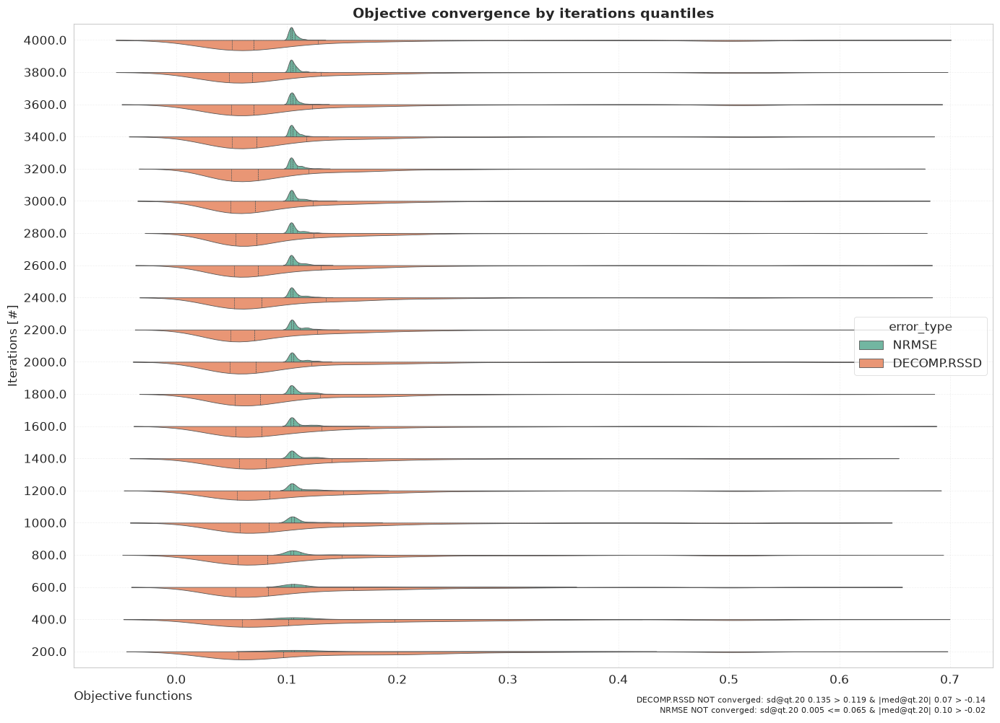

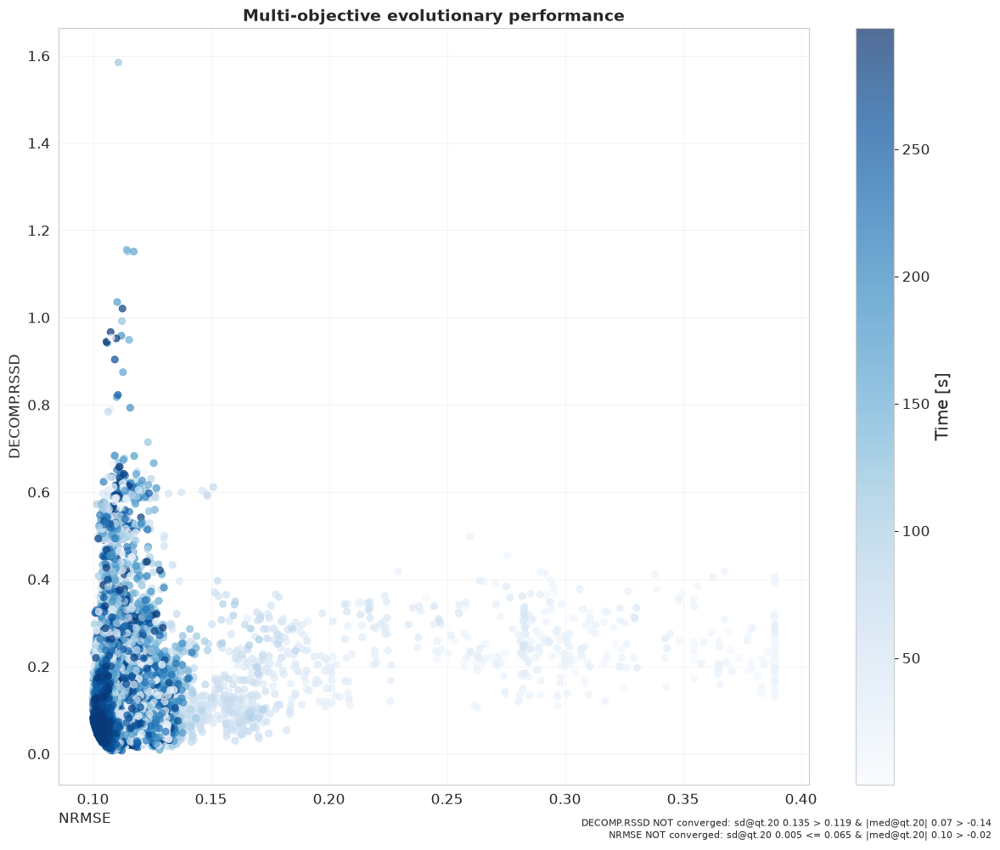

In [21]:
from robyn.modeling.entities.enums import Models, NevergradAlgorithm
from robyn.modeling.entities.modelrun_trials_config import TrialsConfig

np.random.seed(13)

trials_config = TrialsConfig(iterations=4000, trials=5)

output_eng = robyn_eng.train_models(
    trials_config=trials_config,
    ts_validation=True,
    add_penalty_factor=False,
    rssd_zero_penalty=True,
    nevergrad_algo=NevergradAlgorithm.TWO_POINTS_DE,
    model_name=Models.RIDGE,
)

INFO: Evaluating models
2026-08-31 09:58:25,024 - robyn.robyn - INFO - Evaluating models
2026-08-31 09:58:25 [INFO] Starting Pareto optimization
2026-08-31 09:58:25,030 - robyn.modeling.pareto.data_aggregator - INFO - Starting model data aggregation
2026-08-31 09:58:25 [INFO] Computing Pareto fronts
2026-08-31 09:58:27 [INFO] Pareto front computation completed
2026-08-31 09:58:27 [INFO] Preparing Pareto data
2026-08-31 09:58:27 [INFO] Number of Pareto-optimal solutions found: 16455
2026-08-31 09:58:27 [INFO] Selected 2 Pareto-fronts containing 149 candidates
2026-08-31 09:58:27 [INFO] Selected Pareto fronts: 3
2026-08-31 09:58:27 [INFO] Filtering data for selected Pareto fronts...
2026-08-31 09:58:28 [INFO] Pareto data preparation completed
2026-08-31 09:58:28,015 - robyn.modeling.pareto.response_curve - INFO - Calculating response curves for 894 models' media variables...
Processing rows: 100%|██████████| 894/894 [00:24<00:00, 36.35it/s]
2026-08-31 09:58:53,683 - robyn.modeling.pareto

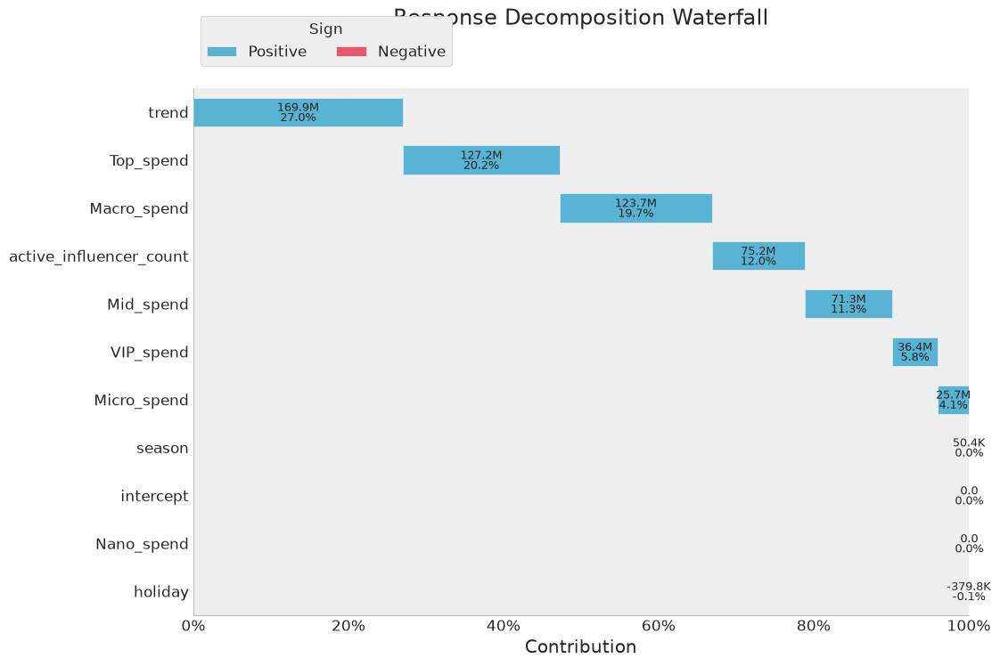

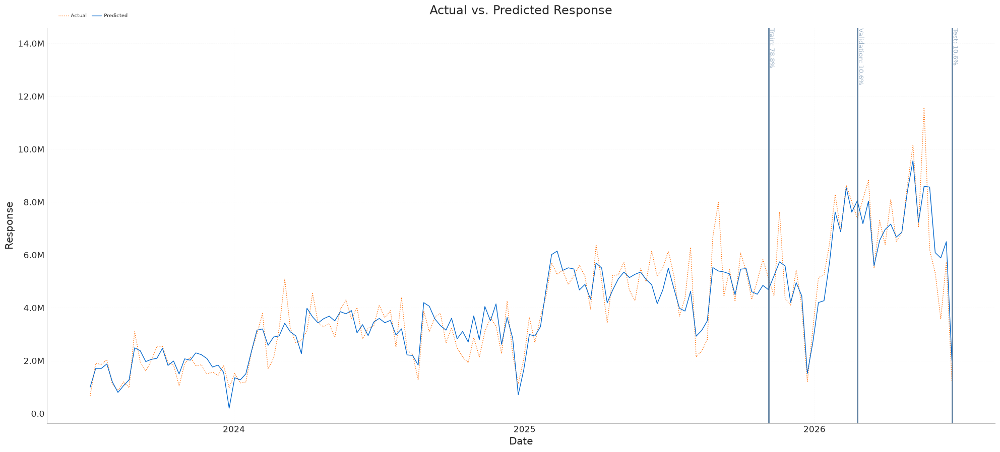

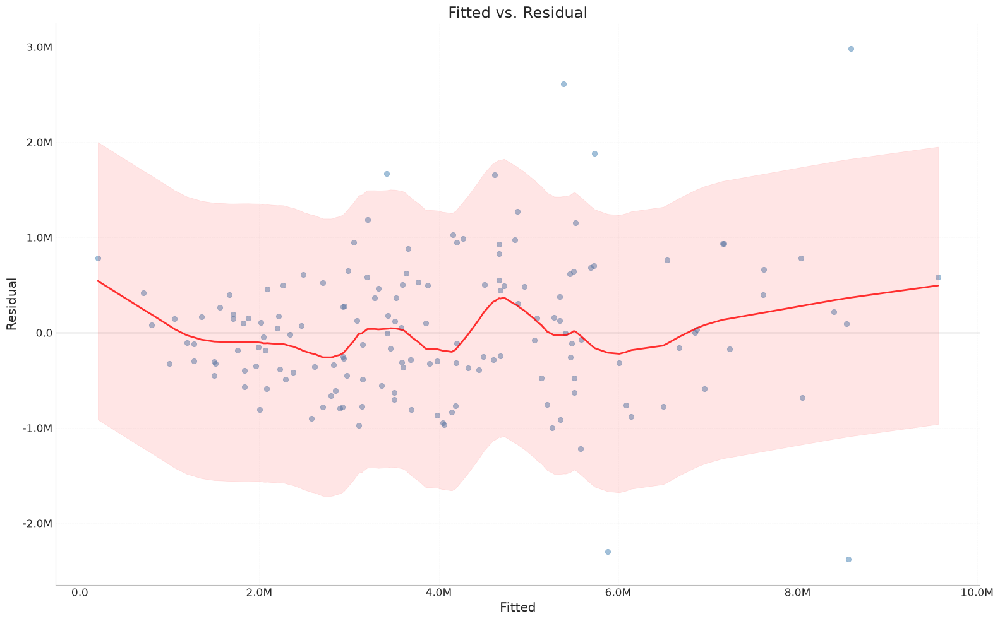

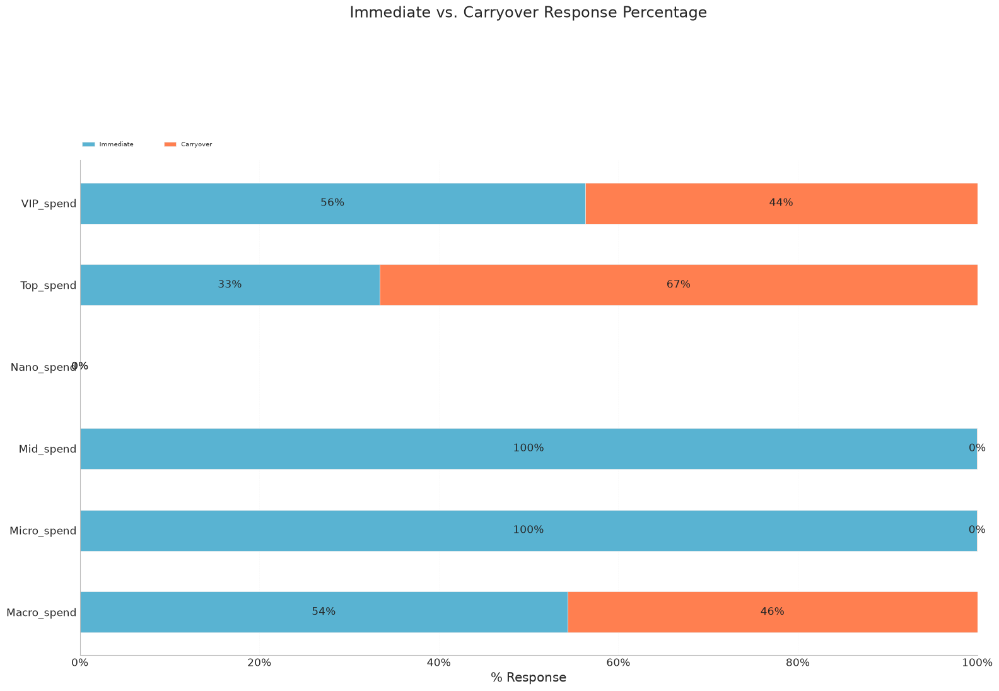

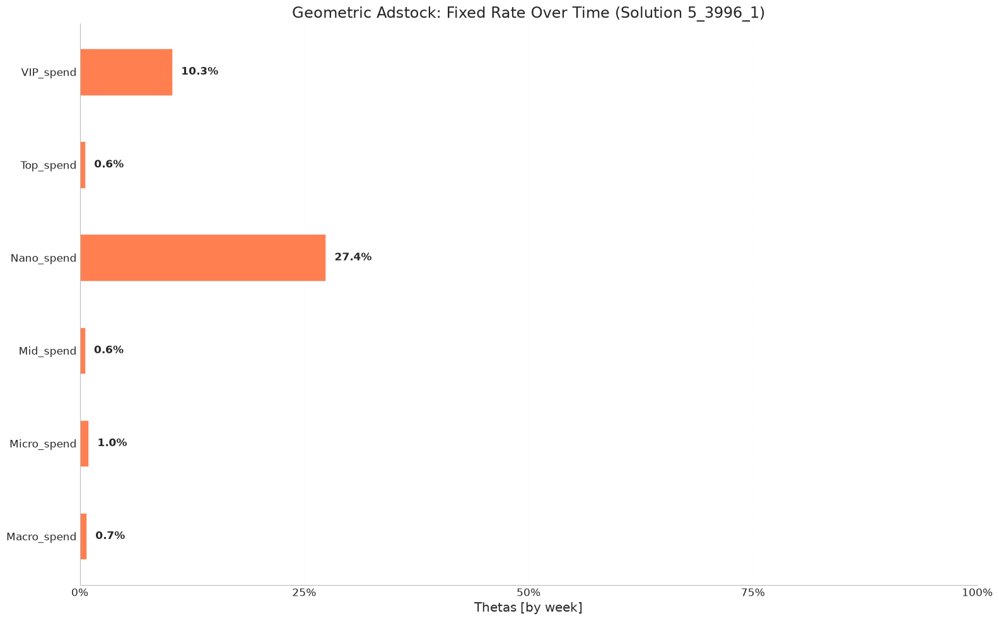

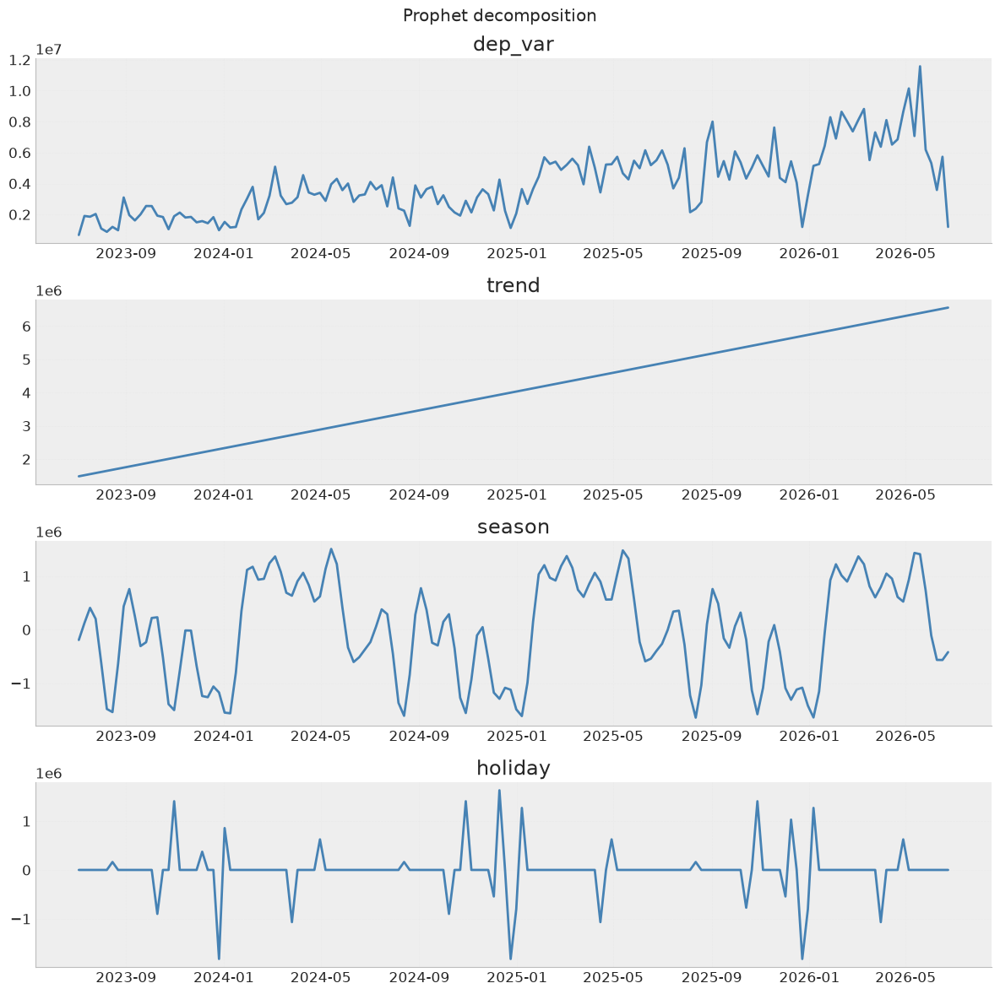

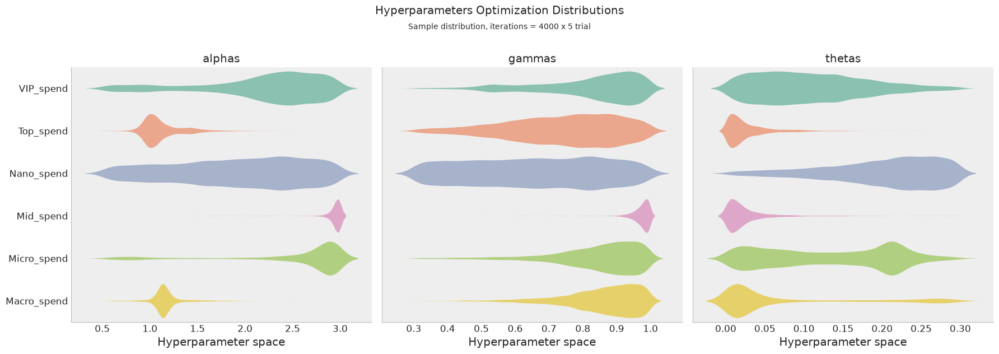

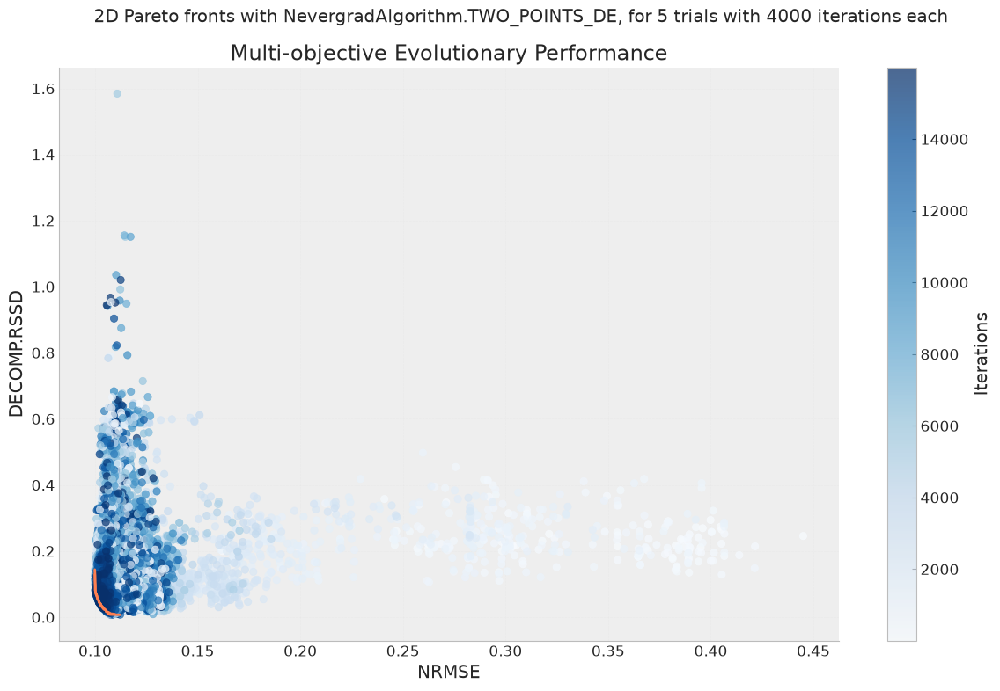

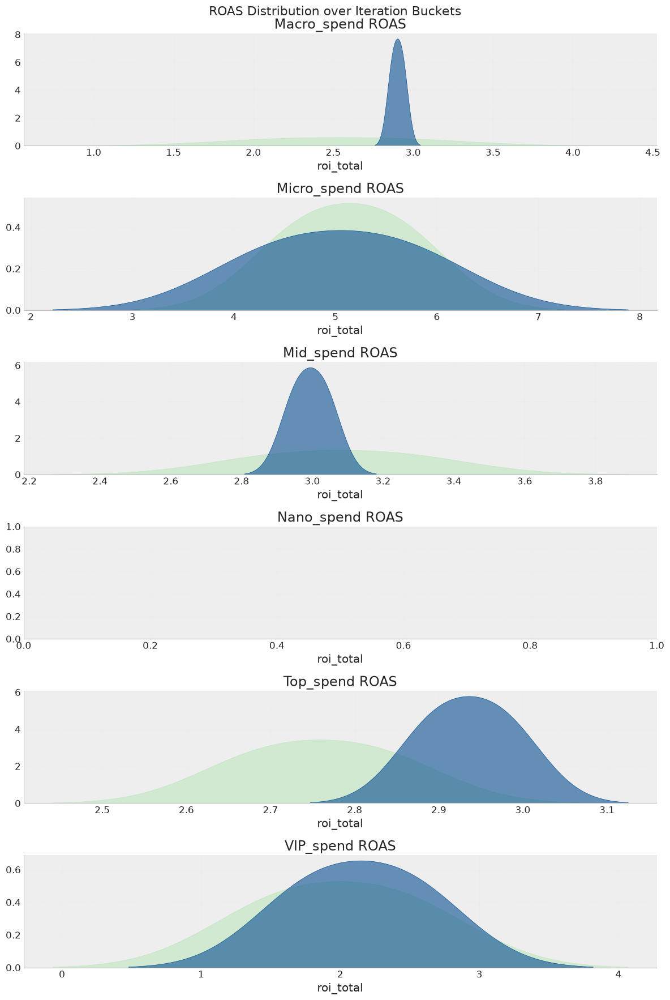

2026-08-31 10:01:14,962 - robyn.visualization.cluster_visualizer - WARNING - create_correlations_heatmap method is not implemented.


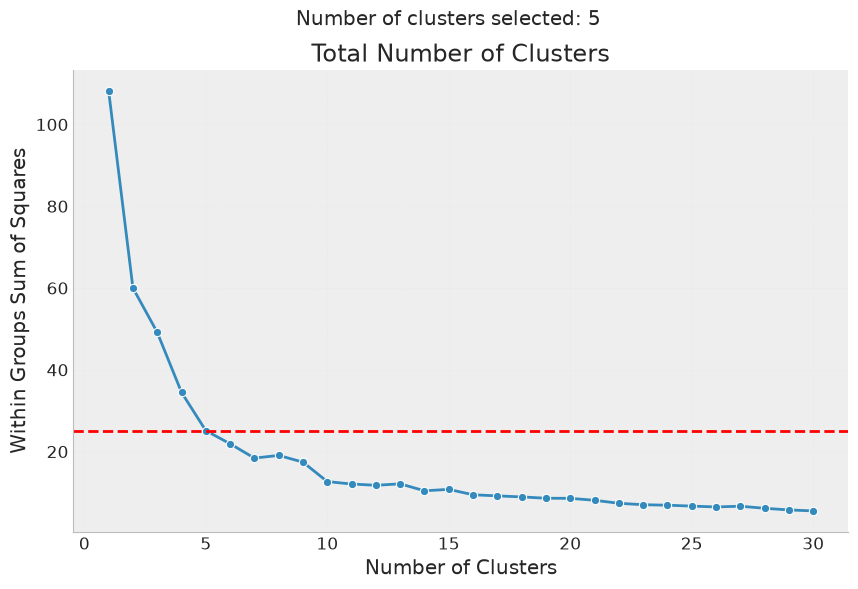

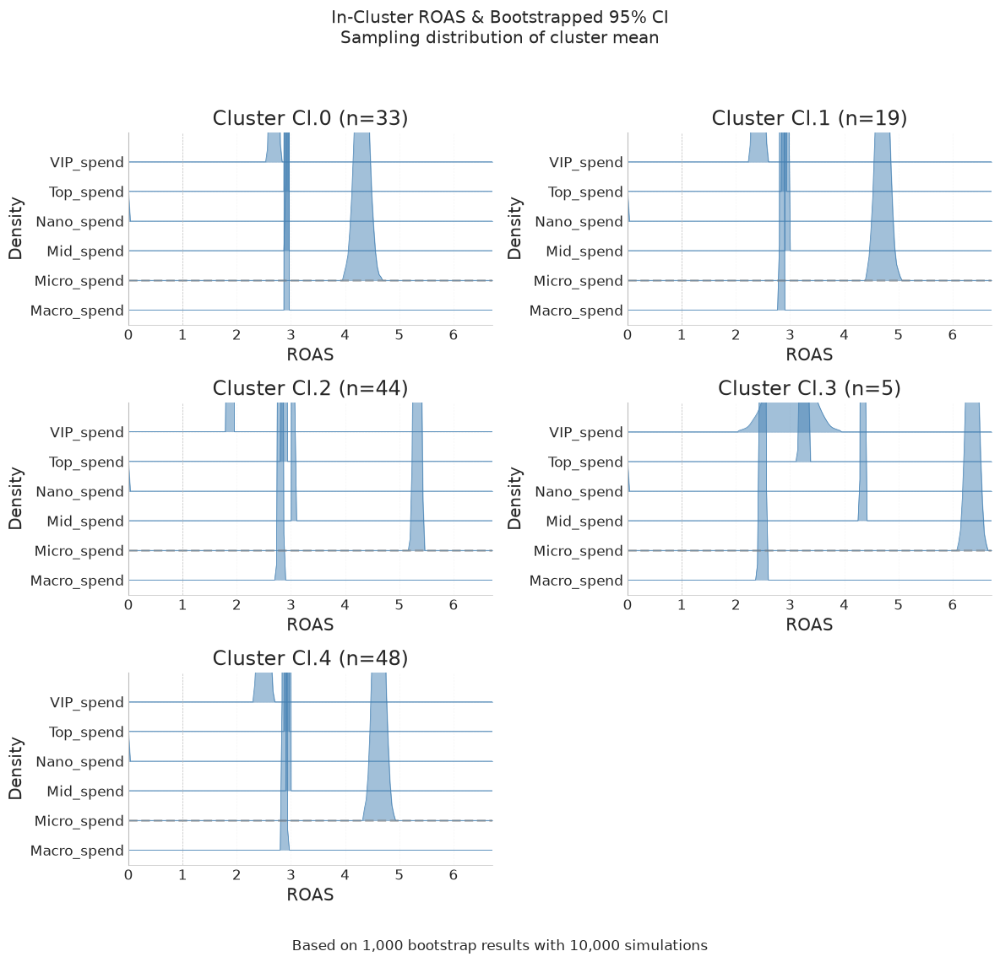

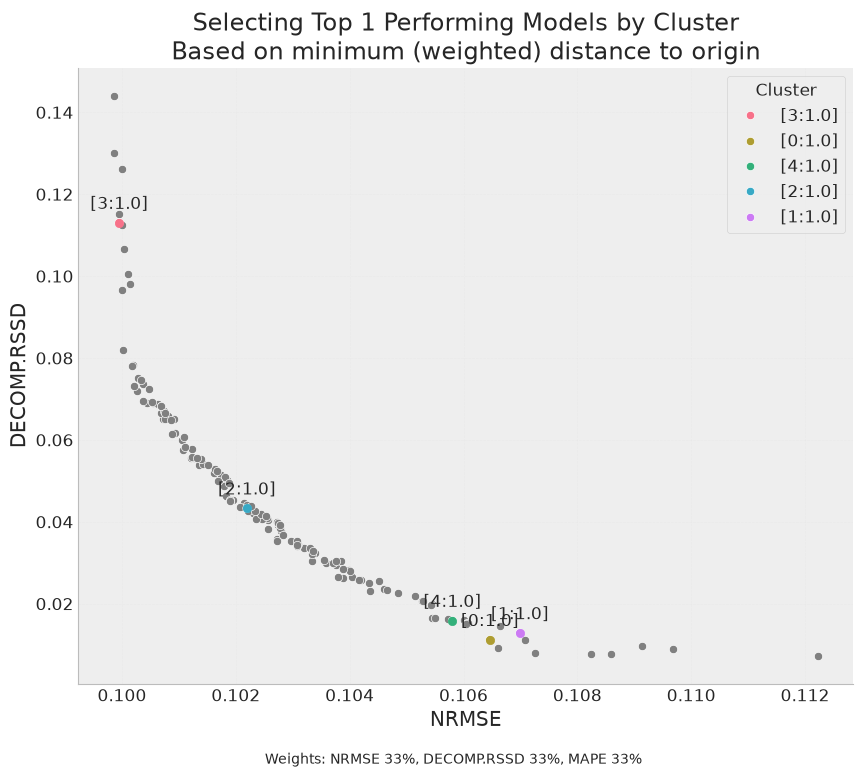

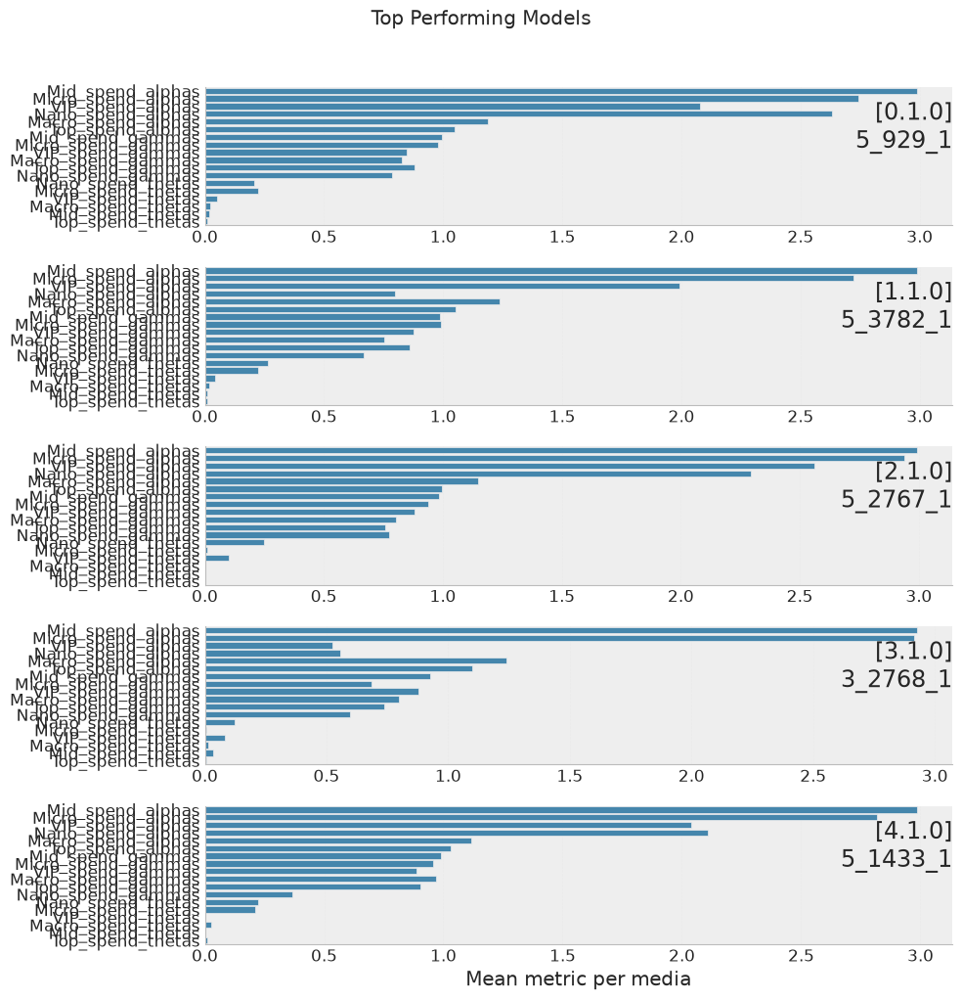

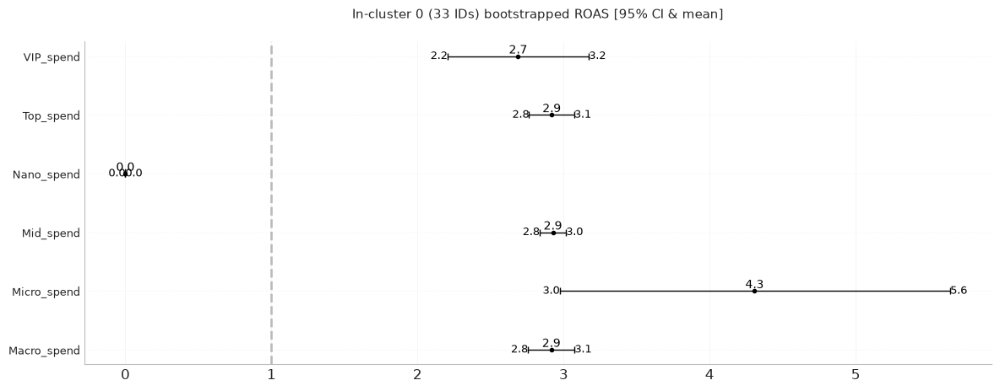

INFO: Model evaluation complete
2026-08-31 10:01:17,581 - robyn.robyn - INFO - Model evaluation complete
2026-08-31 10:01:17,581 - robyn.robyn - INFO - Model evaluation complete


In [22]:
from robyn.modeling.clustering.clustering_config import ClusterBy, ClusteringConfig

configs = ClusteringConfig(
    dep_var_type=DependentVarType(mmm_data_eng.mmmdata_spec.dep_var_type),
    cluster_by=ClusterBy.HYPERPARAMETERS,
    max_clusters=10,
    min_clusters=3,
    weights=[1.0, 1.0, 1.0],
)

robyn_eng.evaluate_models(cluster_config=configs)

In [23]:
df_hyp_eng = robyn_eng.pareto_result.result_hyp_param
df_hyp_eng['best']= 0.9*df_hyp_eng['rsq_test'] + 0.1*(1-df_hyp_eng['decomp.rssd']) # Metric to have both statistical and business accuracy
best_model_eng = df_hyp_eng.loc[df_hyp_eng['best'].idxmax()]
best_model_eng

Macro_spend_alphas                                          1.1187
Macro_spend_gammas                                          0.9688
Macro_spend_thetas                                          0.0281
Micro_spend_alphas                                          2.8188
Micro_spend_gammas                                          0.9567
Micro_spend_thetas                                          0.2100
Mid_spend_alphas                                            2.9840
Mid_spend_gammas                                            0.9890
Mid_spend_thetas                                            0.0036
Nano_spend_alphas                                           2.1077
Nano_spend_gammas                                           0.3668
Nano_spend_thetas                                           0.2235
Top_spend_alphas                                            1.0325
Top_spend_gammas                                            0.9018
Top_spend_thetas                                            0.

In [24]:
df_agg_eng = robyn_eng.pareto_result.x_decomp_agg

# Retrieve the best model coefficients (based on the hybrid metric)
sol_id_eng = best_model_eng['sol_id']
df_sol_eng = df_agg_eng[df_agg_eng['sol_id'] == sol_id_eng]
df_sol_eng


,rn,coef,xDecompAgg,xDecompPerc,xDecompMeanNon0,xDecompMeanNon0Perc,xDecompAggRF,xDecompPercRF,xDecompMeanNon0RF,xDecompMeanNon0PercRF,pos,train_size,rsq_train,rsq_val,rsq_test,nrmse_train,nrmse_val,nrmse_test,nrmse,decomp.rssd,mape,lambda,lambda_hp,lambda_max,lambda_min_ratio,sol_id,trial,iterNG,iterPar,Elapsed,iterations,robynPareto,total_spend,mean_spend,mean_spend_adstocked,mean_carryover,mean_response,spend_share,effect_share,roi_mean,roi_total,cpa_total,cluster,top_sol,boot_mean,boot_se,ci_low,ci_up,carryover_pct
605,intercept,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,True,0.7918,0.8283,0.8233,0.6374,0.0840,0.1058,0.1255,0.1058,0.0158,0.0000,21997.4895,0.0000,188625080.2526,0.0001,5_1433_1,5,1433,1,102.6043,5729,1.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,True,NaN,NaN,NaN,NaN,NaN
606,trend,0.2426,151973084.4074,0.2425,974186.4385,0.2431,151973084.4074,0.2425,974186.4385,0.2431,True,0.7918,0.8283,0.8233,0.6374,0.0840,0.1058,0.1255,0.1058,0.0158,0.0000,21997.4895,0.0000,188625080.2526,0.0001,5_1433_1,5,1433,1,102.6043,5729,1.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,True,NaN,NaN,NaN,NaN,NaN
607,season,0.2731,47492.7146,0.0001,304.4405,0.0001,47492.7146,0.0001,304.4405,0.0001,True,0.7918,0.8283,0.8233,0.6374,0.0840,0.1058,0.1255,0.1058,0.0158,0.0000,21997.4895,0.0000,188625080.2526,0.0001,5_1433_1,5,1433,1,102.6043,5729,1.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,True,NaN,NaN,NaN,NaN,NaN
608,holiday,0.3908,-360315.3163,-0.0006,-12868.4042,-0.0032,-360315.3163,-0.0006,-12868.4042,-0.0032,True,0.7918,0.8283,0.8233,0.6374,0.0840,0.1058,0.1255,0.1058,0.0158,0.0000,21997.4895,0.0000,188625080.2526,0.0001,5_1433_1,5,1433,1,102.6043,5729,1.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,True,NaN,NaN,NaN,NaN,NaN
609,active_influencer_count,1228.1001,75887986.7732,0.1211,486461.4537,0.1214,75887986.7732,0.1211,486461.4537,0.1214,True,0.7918,0.8283,0.8233,0.6374,0.0840,0.1058,0.1255,0.1058,0.0158,0.0000,21997.4895,0.0000,188625080.2526,0.0001,5_1433_1,5,1433,1,102.6043,5729,1.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,True,NaN,NaN,NaN,NaN,NaN
610,Nano_spend,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,True,0.7918,0.8283,0.8233,0.6374,0.0840,0.1058,0.1255,0.1058,0.0158,0.0000,21997.4895,0.0000,188625080.2526,0.0001,5_1433_1,5,1433,1,102.6043,5729,1.0000,499983.3224,3205.0213,4106.7585,908.1457,0.0000,0.0037,0.0000,0.0000,0.0000,inf,4,True,0.0000,0.0000,0.0000,0.0000,0.0000
611,Micro_spend,1198378.7507,18065537.0647,0.0288,115804.7248,0.0289,18065537.0647,0.0288,115804.7248,0.0289,True,0.7918,0.8283,0.8233,0.6374,0.0840,0.1058,0.1255,0.1058,0.0158,0.0000,21997.4895,0.0000,188625080.2526,0.0001,5_1433_1,5,1433,1,102.6043,5729,1.0000,4823297.0087,30918.5706,39132.8825,8147.1747,90147.2535,0.0358,0.0288,2.9156,3.7455,0.2670,4,True,4.6209,0.0961,3.2797,5.9582,0.0160
612,Mid_spend,5356668.9384,72397623.3447,0.1155,464087.3291,0.1158,72397623.3447,0.1155,464087.3291,0.1158,True,0.7918,0.8283,0.8233,0.6374,0.0840,0.1058,0.1255,0.1058,0.0158,0.0000,21997.4895,0.0000,188625080.2526,0.0001,5_1433_1,5,1433,1,102.6043,5729,1.0000,24123686.9028,154639.0186,155393.3948,557.3318,340101.7385,0.1791,0.1155,2.1993,3.0011,0.3332,4,True,2.9604,0.0137,2.7687,3.1519,0.0000
613,Macro_spend,2873512.1013,126785481.9709,0.2023,812727.4485,0.2028,126785481.9709,0.2023,812727.4485,0.2028,True,0.7918,0.8283,0.8233,0.6374,0.0840,0.1058,0.1255,0.1058,0.0158,0.0000,21997.4895,0.0000,188625080.2526,0.0001,5_1433_1,5,1433,1,102.6043,5729,1.0000,43883154.0728,281302.2697,289630.1180,8078.8619,845630.3069,0.3258,0.2023,3.0061,2.8892,0.3461,4,True,2.8788,0.0191,2.6122,3.1447,0.0272
614,Top_spend,2501310.2873,133946843.5636,0.2137,858633.6126,0.2143,133946843.5636,0.2137,858633.6126,0.2143,True,0.7918,0.8283,0.8233,0.6374,0.0840,0.1058,0.1255,0.1058,0.0158,0.0000,21997.4895,0.0000,188625080.2526,0.0001,5_1433_1,5,1433,1,102.6043,5729,1.0000,44892575.2143,287772.9180,291391.0269,3044.0819,888188.4236,0.3333,0.2137,3.0

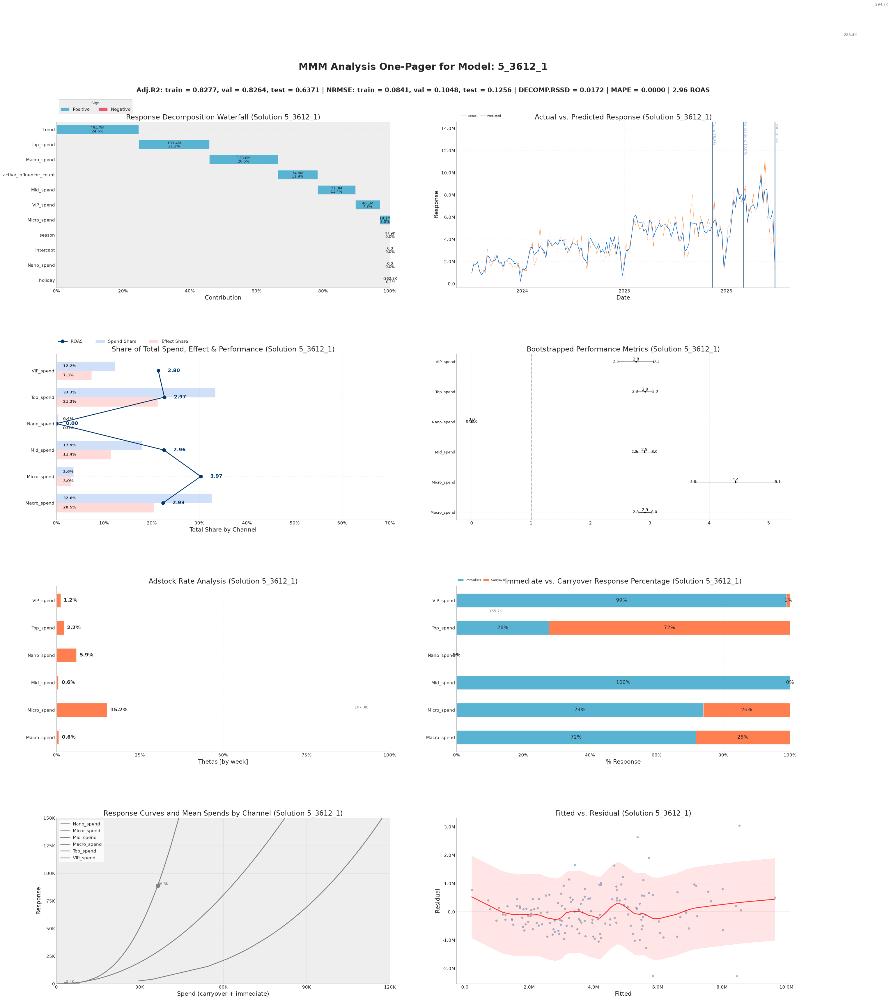

In [ ]:
#one_pager = OnePager(
#    pareto_result=robyn_eng.pareto_result,          # Résultat du Pareto généré après l'entraînement/évaluation
#    clustered_result=robyn_eng.cluster_result,  # Résultat du clustering (généré par evaluate_models)
#    hyperparameter=hyperparameters,               # Votre objet Hyperparameters défini plus haut
#    mmm_data=mmm_data_eng,                        # Votre objet MMMData
#    holidays_data=holidays_data                   # Votre objet HolidaysData
#)

# 2. Générer le One-Pager pour UN seul ID de solution
# (La méthode renvoie une liste de figures, on prend le premier élément [0])
#figures = one_pager.generate_one_pager(
#    solution_ids="5_3612_1")                     # Remplacez par votre sol_id exact)

In [25]:
tier_to_channel = {
    '1-Nano': 'Nano_spend',
    '2-Micro': 'Micro_spend',
    '3-Mid': 'Mid_spend',
    '4-Macro': 'Macro_spend',
    '5-Top': 'Top_spend',
    '6-VIP': 'VIP_spend',
}


alphas_eng = []
gammas_eng = []
thetas_eng = []
coefficients_eng = []

for tier in tiers_data['tier']:
  channel = tier_to_channel.get(tier)

  # Retrieve alpha gamma and theta coefficients from the best model for each tier
  alpha_val_eng = best_model_eng[f'{channel}_alphas']
  gamma_val_eng = best_model_eng[f'{channel}_gammas']
  theta_val_eng = best_model_eng[f'{channel}_thetas']


  # Retrieve the C coefficient for each tier 
  coef_val_eng = df_agg_eng.loc[
      (df_agg_eng['sol_id'] == best_model_eng['sol_id']) & (df_agg_eng['rn'] == channel), 'coef'
  ].values[0]

  alphas_eng.append(alpha_val_eng)
  gammas_eng.append(gamma_val_eng)
  thetas_eng.append(theta_val_eng)
  coefficients_eng.append(coef_val_eng)

# Put the coefficient lists into the tiers data frame
tiers_data['alpha_eng'] = alphas_eng
tiers_data['gamma_pct_eng'] = gammas_eng
tiers_data['theta_eng'] = thetas_eng
tiers_data['coef_eng'] = coefficients_eng


In [26]:
tiers_data

,tier,nb_createurs_uniques,total_spent_eur,total_eng,total_views,total_posts_delivered,median_cost_per_post,avg_engagement_rate,CPE_global,CPV_global,max_spend,alpha_eng,gamma_pct_eng,theta_eng,coef_eng
0,1-Nano,835,500428.9333,897316,767032369,4072,150.0000,0.1206,0.5577,0.0007,10825.2335,2.1077,0.3668,0.2235,0.0000
1,2-Micro,2817,4592660.9042,9371740,4833415930,20061,331.9805,0.0574,0.4901,0.0010,75387.3221,2.8188,0.9567,0.2100,1198378.7507
2,3-Mid,4967,23790334.3742,52005312,16783549593,34138,813.0233,0.0332,0.4575,0.0014,339318.5324,2.9840,0.9890,0.0036,5356668.9384
3,4-Macro,3900,44276793.0248,124948509,25001747749,32276,1589.0400,0.0237,0.3544,0.0018,609611.2955,1.1187,0.9688,0.0281,2873512.1013
4,5-Top,1909,45568791.9066,199032904,18800781925,19963,2889.1636,0.0177,0.2290,0.0024,561659.0916,1.0325,0.9018,0.0106,2501310.2873
5,6-VIP,297,16420218.5434,115645933,4449024183,3270,5357.1429,0.0124,0.1420,0.0037,303318.9319,2.0393,0.8887,0.0038,2465748.8885


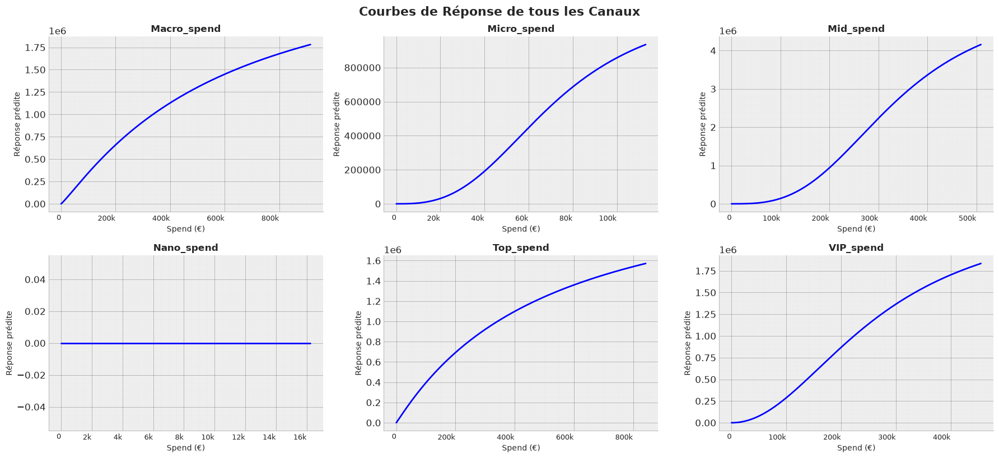

In [27]:
import math 
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker  

tiers_name = tiers_data['tier'].tolist()


row_hyp_eng = df_hyp_eng.loc[df_hyp_eng['best'].idxmax()]
df_agg_eng = robyn_eng.pareto_result.x_decomp_agg

channels = [col.replace('_alphas', '') for col in row_hyp_eng.index if col.endswith('_alphas')]

n_channels = len(channels)
n_cols = 3
n_rows = math.ceil(n_channels / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, n_rows * 4))
axes = axes.flatten()


# Definition of the Hill response curve
def get_hill_curve(spend_array, alpha, gamma_abs, coef):
  numerator = spend_array**alpha
  denominator = (spend_array**alpha) + (gamma_abs**alpha)
  return coef * (numerator / (denominator + 1e-9))
#-----------------------


channel_to_tier = {v: k for k, v in tier_to_channel.items()}


for i, channel in enumerate(channels):
  ax = axes[i]

  # Retrives coefficients for each tiers
  alpha_eng = row_hyp_eng[f'{channel}_alphas']
  gamma_pct_eng = row_hyp_eng[f'{channel}_gammas']
  coef_row_eng = df_agg_eng[
      (df_agg_eng['sol_id'] == best_model_eng['sol_id'])
      & (df_agg_eng['rn'] == channel)
  ]

  if coef_row_eng.empty:
    continue
  coef_eng = coef_row_eng['coef'].values[0]
  # -------------------------------------------



  tier_name = channel_to_tier.get(channel)
  tier_row = tiers_data[tiers_data['tier'] == tier_name]

  # Compute the response curve for each tier on the maximum spend week
  if not tier_row.empty:
    max_spend = tier_row['max_spend'].values[0]
  else:
    max_spend = 50000

  gamma_abs_eng = gamma_pct_eng * max_spend

  spends = np.linspace(0, max(max_spend * 1.5, 10000), 200)
  response = get_hill_curve(spends, alpha_eng, gamma_abs_eng, coef_eng)
  #--------------------------------------------

  ax.plot(spends, response, color='blue', linewidth=2)
  ax.set_title(f'{channel}', fontsize=12, weight='bold')
  ax.set_xlabel('Spend (€)', fontsize=10)
  ax.set_ylabel('Réponse prédite', fontsize=10)
  ax.grid(True, alpha=0.3)
  ax.minorticks_on()  
  ax.grid(True, which='major', linestyle='-', linewidth=0.7, alpha=0.5, color='gray') 
  ax.grid(True, which='minor', linestyle=':', linewidth=0.5, alpha=0.3, color='lightgray') 
  ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f'{x*1e-6:.1f}M' if x >= 1e6 else f'{int(x*1e-3)}k' if x >= 1e3 else str(int(x))))
  plt.setp(ax.get_xticklabels(), rotation=0, ha='right', fontsize=9)



for j in range(i + 1, len(axes)):
  fig.delaxes(axes[j])

plt.tight_layout()
plt.suptitle(
    'Courbes de Réponse de tous les Canaux',
    fontsize=16,
    y=1.02,
    weight='bold',
)
plt.show()


# MMM fit for views

In [28]:
# Load  weekly data
dt_weekly_views = pd.read_csv("/home/user/mmm_influencers/source_documents/views_mmm_input_data.csv")# ----------- si le tableau est mis en csv au préalable
#dt_weekly_views = mmm_views_input
dt_weekly_views.rename(columns={'total_views': 'dep_var'}, inplace=True)
if 'Unnamed: 0' in dt_weekly_views.columns:
    dt_weekly_views = dt_weekly_views.drop(columns=['Unnamed: 0'])

dt_weekly_views.columns = [c.strip() for c in dt_weekly_views.columns]

In [29]:
mmm_data_spec_views = MMMData.MMMDataSpec(
    dep_var="dep_var",  # Target variable
    dep_var_type="revenue",  # Type: "revenue" or "conversion"
    date_var="time",  
    context_vars=["active_influencer_count"],
    factor_vars = [],  
    paid_media_spends=paid_media_columns,  # Media spend columns
    paid_media_vars=paid_media_columns,  # Media metrics
    organic_vars=[],  
    window_start=start_date,  # Analysis start date
    window_end=end_date,  # Analysis end date
)

mmm_data_views = MMMData(data=dt_weekly_views, mmmdata_spec=mmm_data_spec_views)

In [30]:
robyn_views = Robyn(working_dir="output")
robyn_views.initialize(
    mmm_data=mmm_data_views,
    holidays_data=holidays_data,
    hyperparameters=hyperparameters,
)

INFO: Initialized Robyn in output
INFO: Initialized Robyn in output
2026-08-31 10:02:23,303 - robyn.robyn - INFO - Initialized Robyn in output
INFO: Validating input data
INFO: Validating input data
INFO: Initialized Robyn in output
2026-08-31 10:02:23,303 - robyn.robyn - INFO - Initialized Robyn in output
INFO: Validating input data
INFO: Validating input data
2026-08-31 10:02:23,309 - robyn.robyn - INFO - Validating input data
2026-08-31 10:02:23,314 - robyn.data.validation.mmmdata_validation - INFO - Starting complete MMMData validation
2026-08-31 10:02:23,319 - robyn.data.validation.mmmdata_validation - INFO - Missing and infinite value check passed successfully
2026-08-31 10:02:23,325 - robyn.data.validation.mmmdata_validation - INFO - No-variance check passed successfully
2026-08-31 10:02:23,326 - robyn.data.validation.mmmdata_validation - INFO - Variable names validation passed successfully
2026-08-31 10:02:23,331 - robyn.data.validation.mmmdata_validation - INFO - Date variable

In [31]:
%matplotlib inline

# Run feature engineering
robyn_views.feature_engineering();

INFO: Performing feature engineering
INFO: Performing feature engineering
2026-08-31 10:02:28,114 - robyn.robyn - INFO - Performing feature engineering
INFO: Performing feature engineering
2026-08-31 10:02:28,114 - robyn.robyn - INFO - Performing feature engineering
2026-08-31 10:02:28,123 - robyn.modeling.feature_engineering - INFO - Starting feature engineering process
2026-08-31 10:02:28,126 - robyn.modeling.feature_engineering - INFO - Starting Prophet decomposition
2026-08-31 10:02:28,128 - robyn.modeling.feature_engineering - INFO - Starting Prophet decomposition
/home/user/mmm_influencers/robyn-venv/lib/python3.11/site-packages/prophet/forecaster.py:190: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.holidays['ds'] = pd.to_datetime(sel

INFO: Training models
INFO: Training models
2026-08-31 10:02:30,625 - robyn.robyn - INFO - Training models
2026-08-31 10:02:30,630 - robyn.modeling.base_model_executor - INFO - Initializing BaseModelExecutor
2026-08-31 10:02:30,631 - robyn.modeling.model_executor - INFO - Starting model execution with model_name=Models.RIDGE
2026-08-31 10:02:30,632 - robyn.modeling.base_model_executor - INFO - Input validation successful
2026-08-31 10:02:30,633 - robyn.common.common_util - WARNING - Requested cores (16) exceeds available cores (4). Will use 4 cores.
2026-08-31 10:02:30,634 - robyn.modeling.base_model_executor - INFO - Preparing hyperparameters
2026-08-31 10:02:30,635 - robyn.modeling.base_model_executor - INFO - Completed hyperparameter preparation with 20 parameters to optimize
2026-08-31 10:02:30,636 - robyn.modeling.model_executor - INFO - Initializing Ridge model builder
2026-08-31 10:02:30,646 - robyn.modeling.model_executor - INFO - Building models with configured parameters
2026

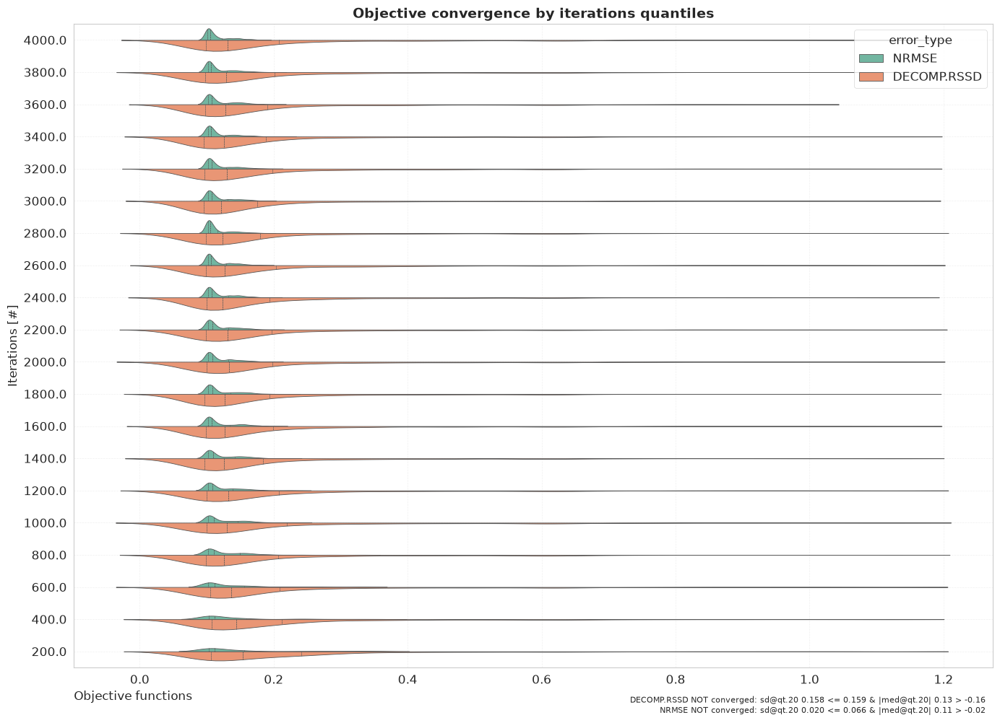

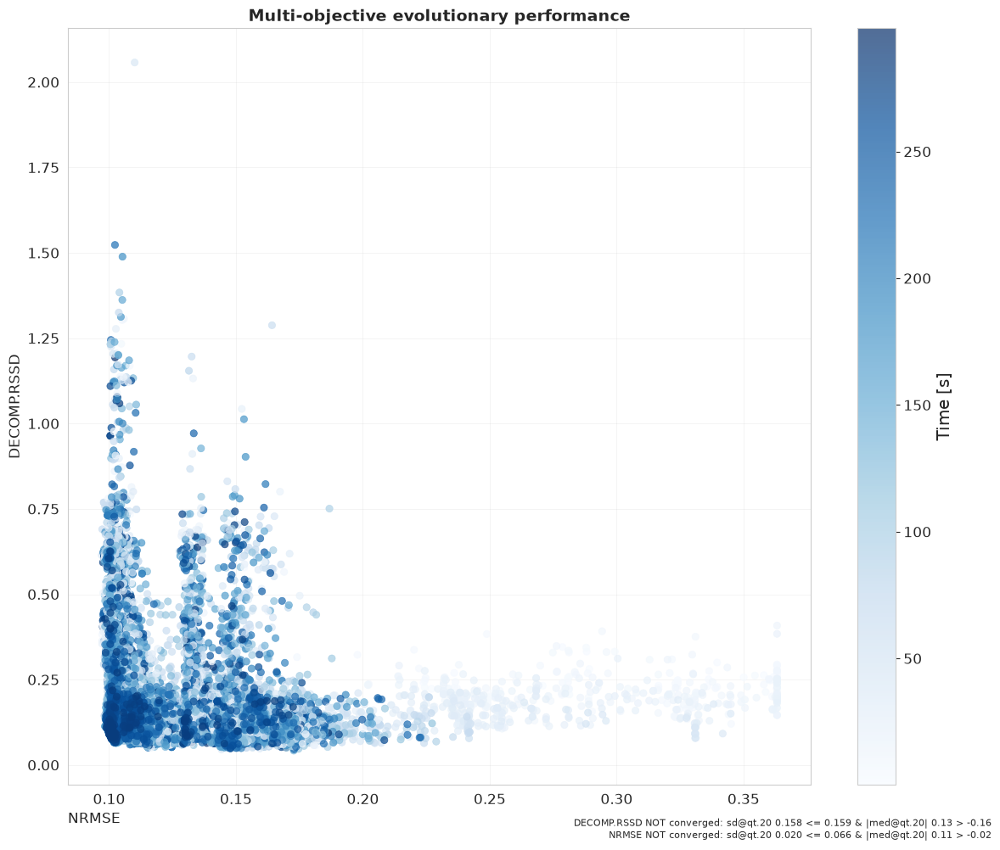

In [32]:
from robyn.modeling.entities.enums import Models, NevergradAlgorithm
from robyn.modeling.entities.modelrun_trials_config import TrialsConfig

np.random.seed(42)
trials_config = TrialsConfig(iterations=4000, trials=5)

robyn_views.train_models(
    trials_config=trials_config,
    ts_validation=True,
    add_penalty_factor=False,
    rssd_zero_penalty=True,
    nevergrad_algo=NevergradAlgorithm.TWO_POINTS_DE,
    model_name=Models.RIDGE,
)

INFO: Evaluating models


INFO: Evaluating models
2026-08-31 11:32:20,457 - robyn.robyn - INFO - Evaluating models
2026-08-31 11:32:20 [INFO] Starting Pareto optimization
2026-08-31 11:32:20,491 - robyn.modeling.pareto.data_aggregator - INFO - Starting model data aggregation
2026-08-31 11:32:20 [INFO] Computing Pareto fronts
2026-08-31 11:32:23 [INFO] Pareto front computation completed
2026-08-31 11:32:23 [INFO] Preparing Pareto data
2026-08-31 11:32:23 [INFO] Number of Pareto-optimal solutions found: 16037
2026-08-31 11:32:23 [INFO] Selected 2 Pareto-fronts containing 127 candidates
2026-08-31 11:32:23 [INFO] Selected Pareto fronts: 3
2026-08-31 11:32:23 [INFO] Filtering data for selected Pareto fronts...
2026-08-31 11:32:23 [INFO] Pareto data preparation completed
2026-08-31 11:32:23,976 - robyn.modeling.pareto.response_curve - INFO - Calculating response curves for 762 models' media variables...
Processing rows: 100%|██████████| 762/762 [00:21<00:00, 35.91it/s]
2026-08-31 11:32:45,936 - robyn.modeling.pareto

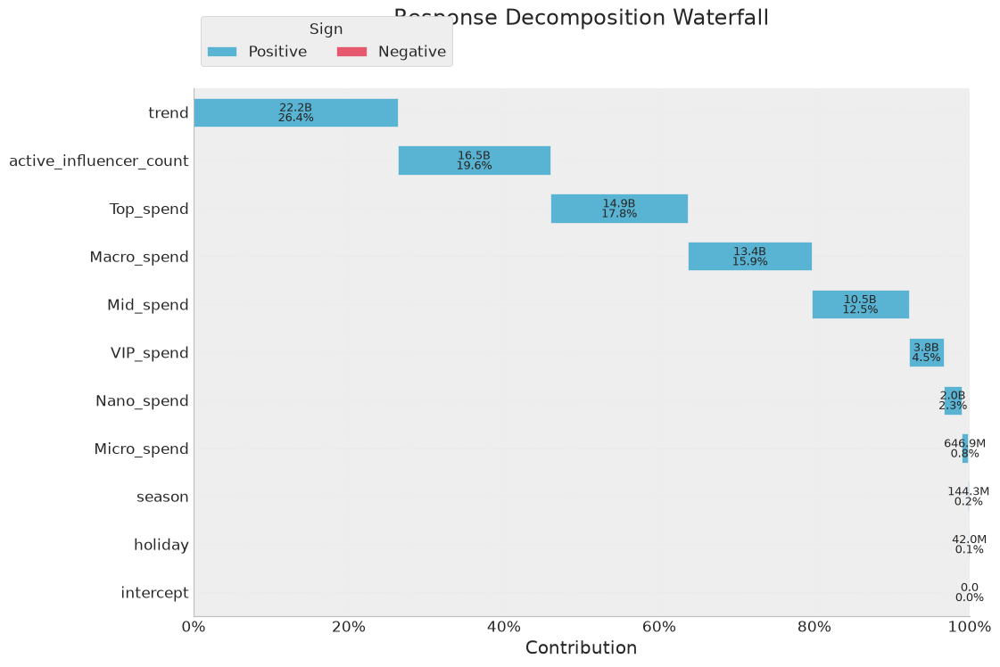

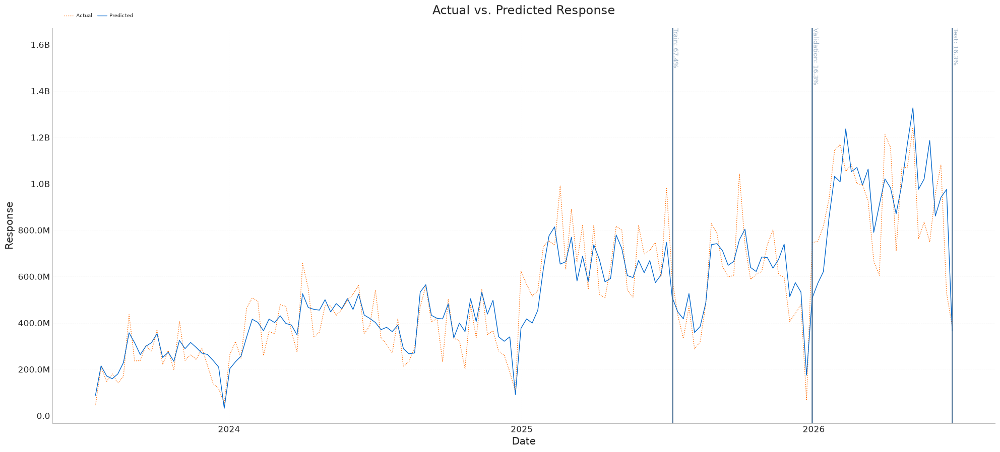

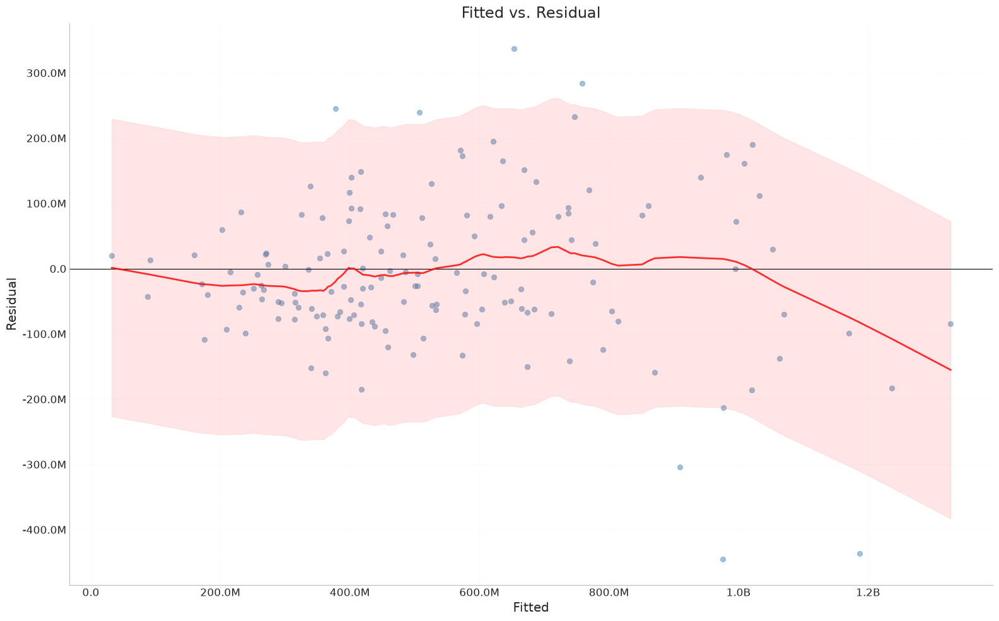

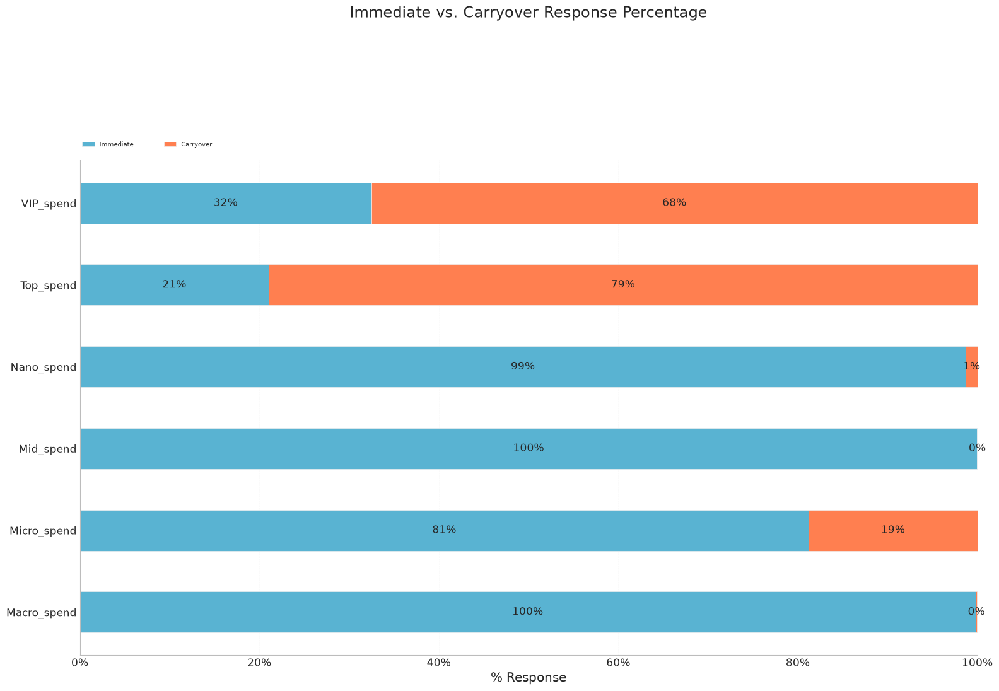

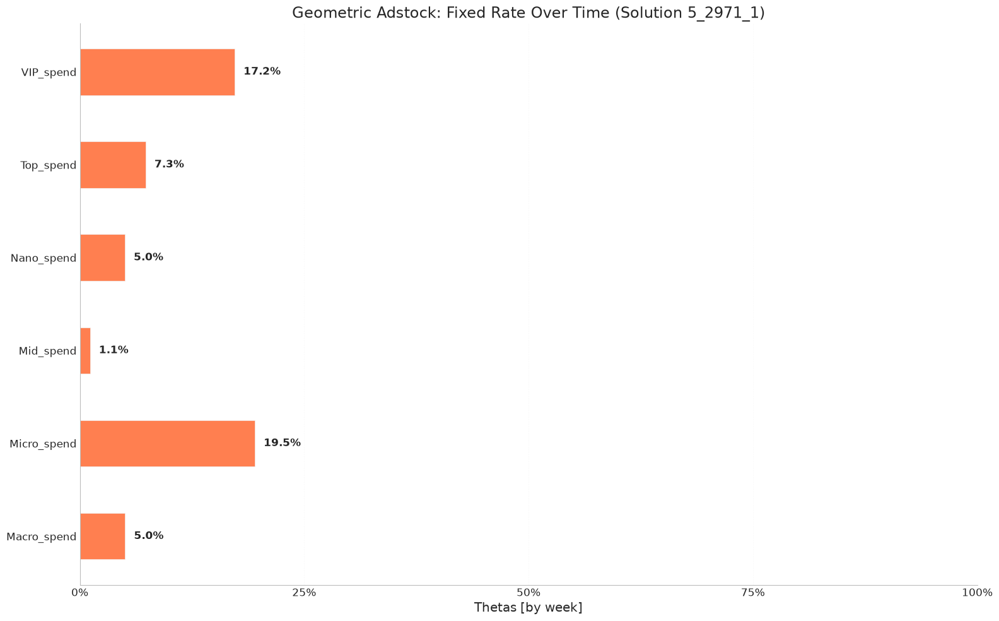

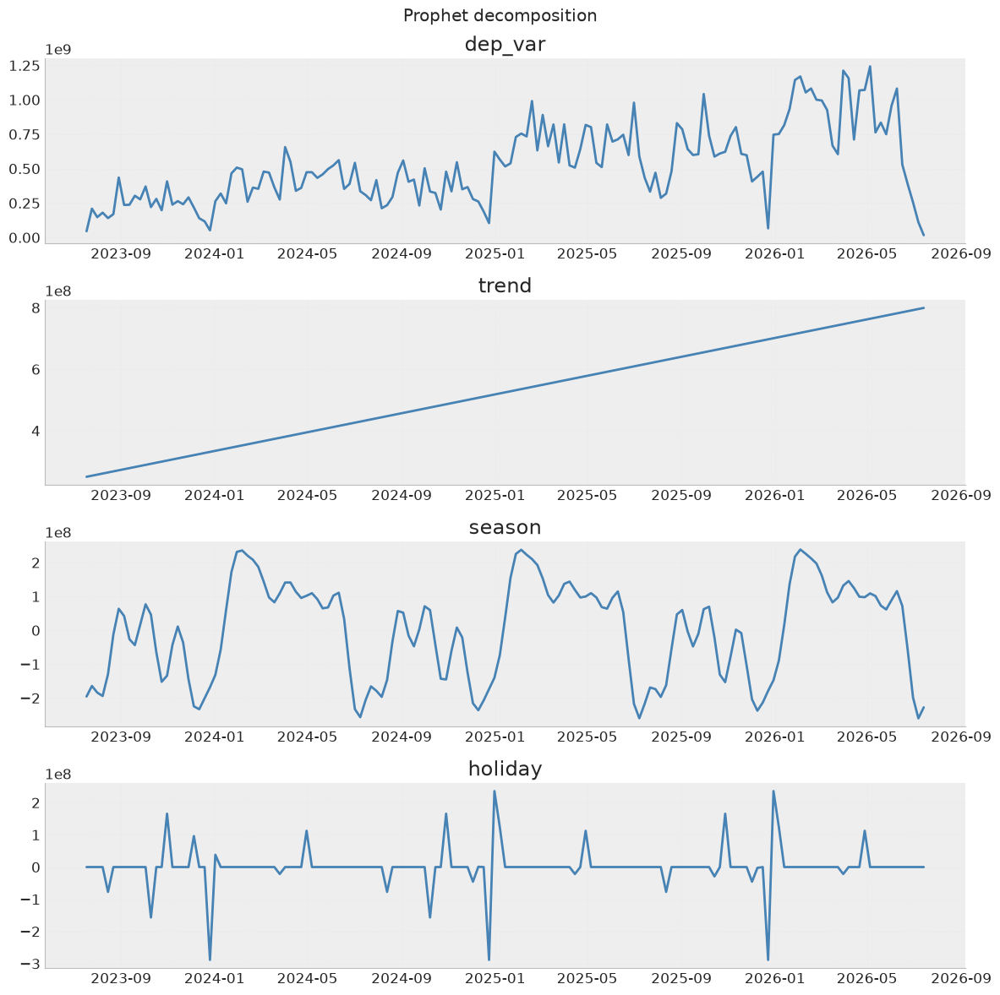

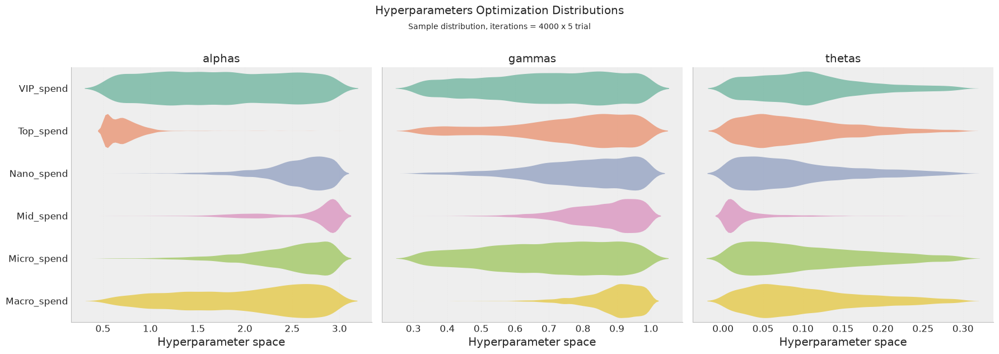

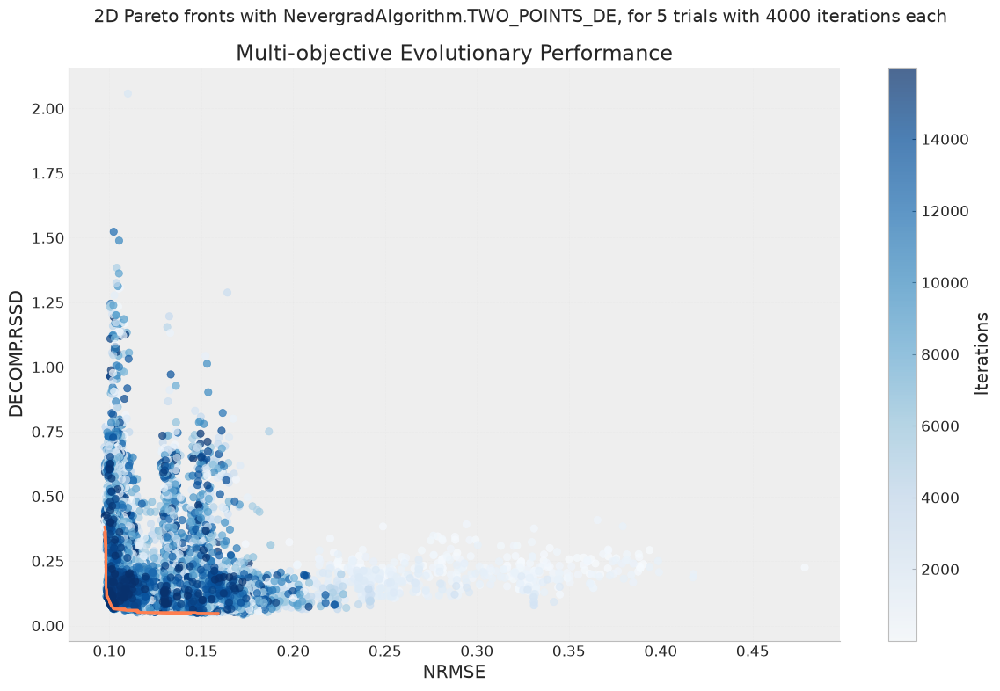

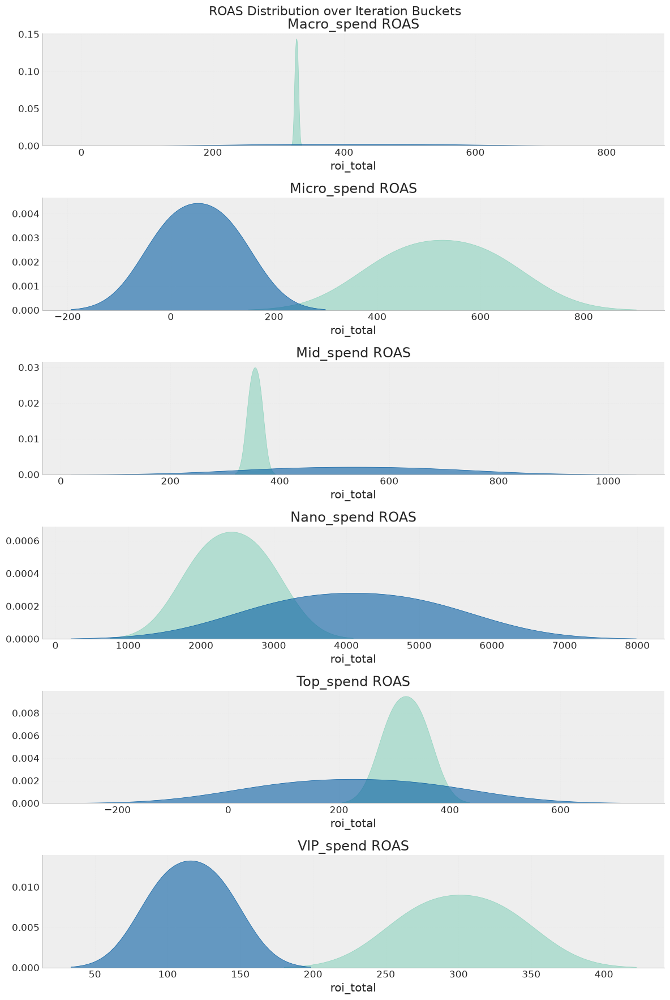

2026-08-31 11:35:02,660 - robyn.visualization.cluster_visualizer - WARNING - create_correlations_heatmap method is not implemented.


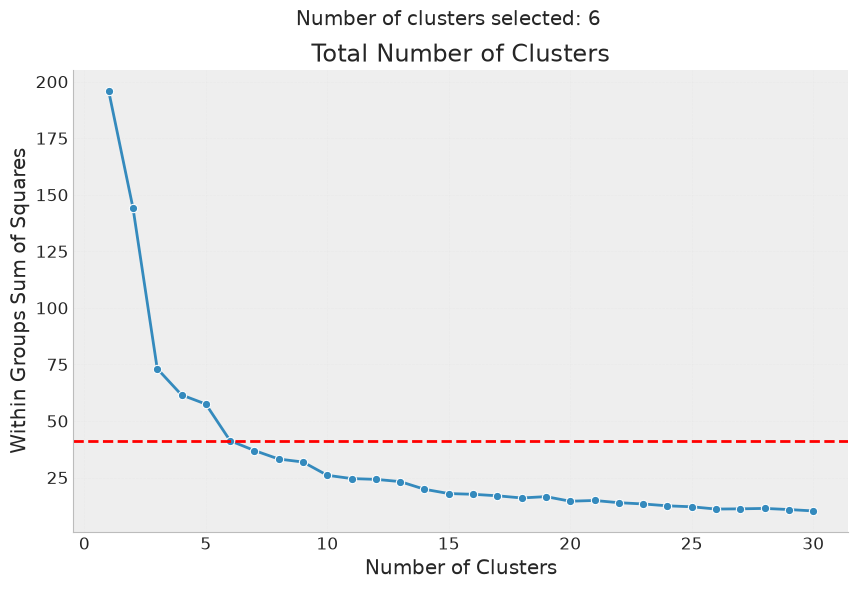

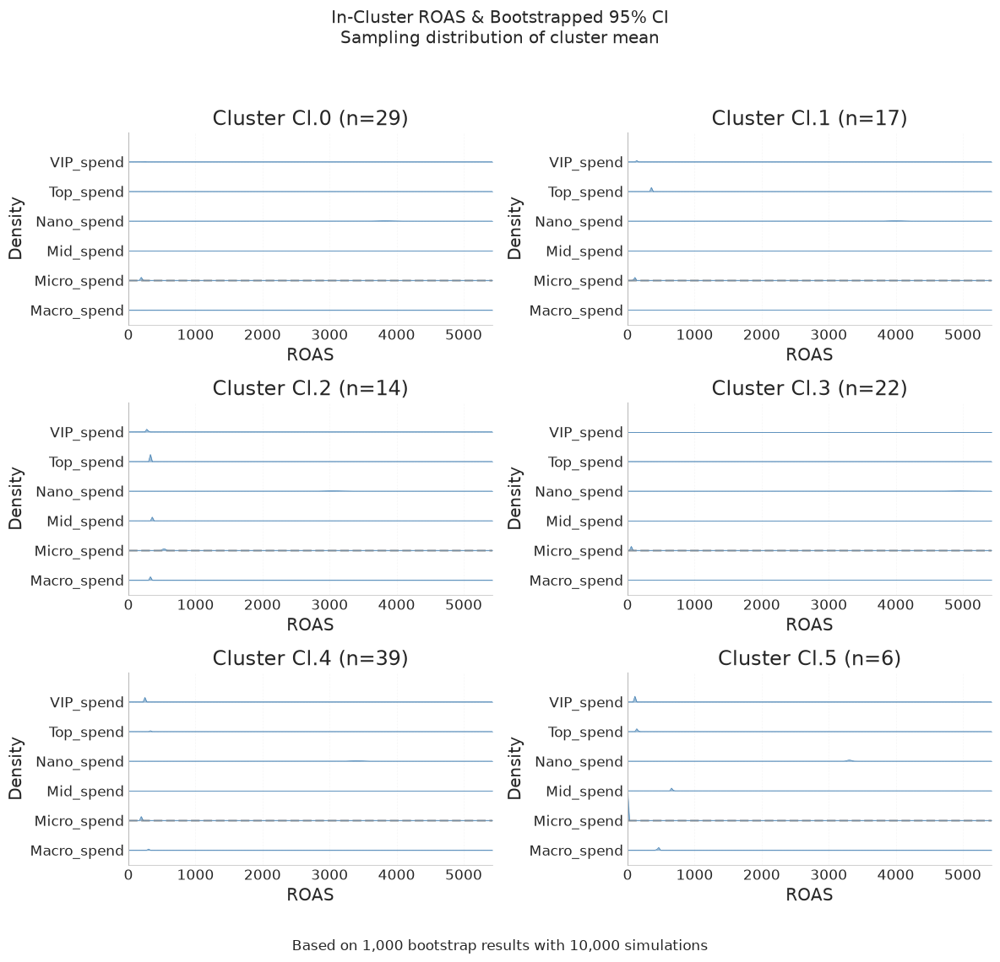

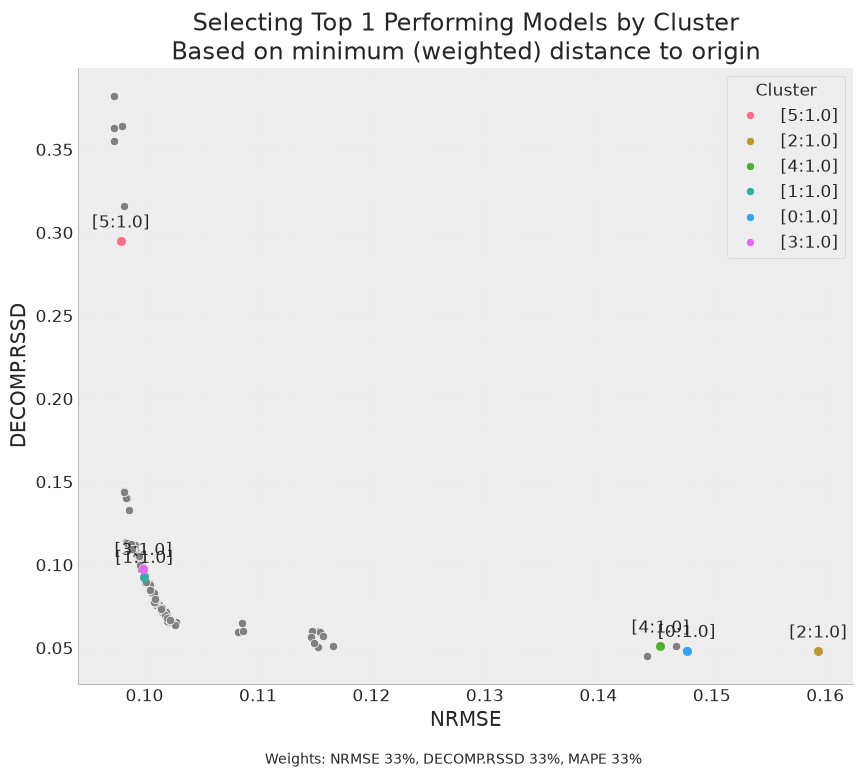

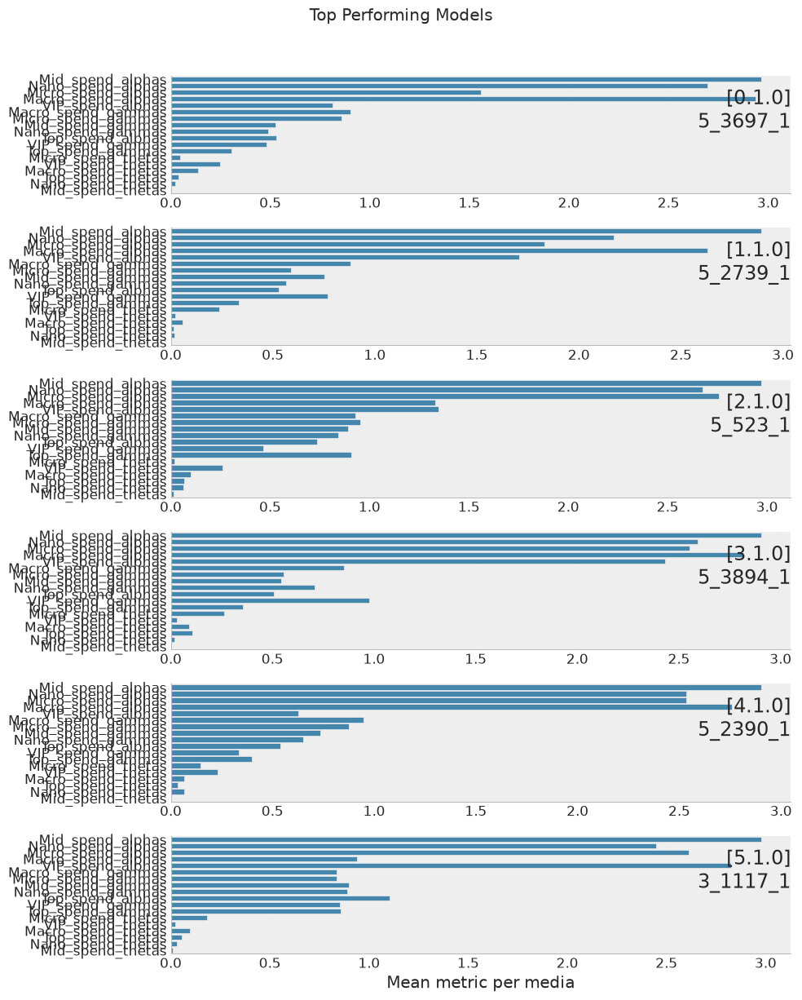

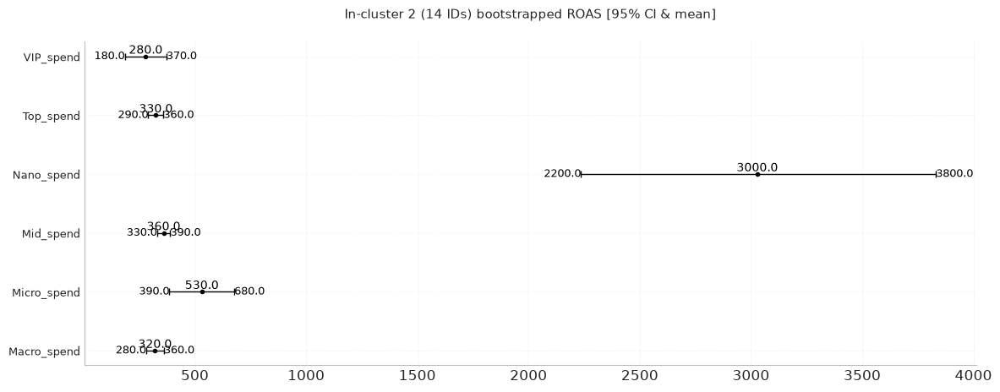

INFO: Model evaluation complete
INFO: Model evaluation complete
INFO: Model evaluation complete
2026-08-31 11:35:05,585 - robyn.robyn - INFO - Model evaluation complete


In [33]:
from robyn.modeling.clustering.clustering_config import ClusterBy, ClusteringConfig

configs = ClusteringConfig(
    dep_var_type=DependentVarType(mmm_data_views.mmmdata_spec.dep_var_type),
    cluster_by=ClusterBy.HYPERPARAMETERS,
    max_clusters=10,
    min_clusters=3,
    weights=[1.0, 1.0, 1.0],
)

robyn_views.evaluate_models(cluster_config=configs)

In [34]:
df_hyp_views = robyn_views.pareto_result.result_hyp_param
df_hyp_views['best']= 0.9*df_hyp_views['rsq_test'] + 0.1*(1-df_hyp_views['decomp.rssd'])
best_model_views = df_hyp_views.loc[df_hyp_views['best'].idxmax()]
best_model_views

Macro_spend_alphas                                          2.9391
Macro_spend_gammas                                          0.9020
Macro_spend_thetas                                          0.1352
Micro_spend_alphas                                          1.5587
Micro_spend_gammas                                          0.8590
Micro_spend_thetas                                          0.0464
Mid_spend_alphas                                            2.9656
Mid_spend_gammas                                            0.5281
Mid_spend_thetas                                            0.0009
Nano_spend_alphas                                           2.6965
Nano_spend_gammas                                           0.4903
Nano_spend_thetas                                           0.0244
Top_spend_alphas                                            0.5301
Top_spend_gammas                                            0.3059
Top_spend_thetas                                            0.

In [35]:
df_agg_views = robyn_views.pareto_result.x_decomp_agg

sol_id_views = best_model_views['sol_id']
df_sol_views = df_agg_views[df_agg_views['sol_id'] == sol_id_views]
df_sol_views


,rn,coef,xDecompAgg,xDecompPerc,xDecompMeanNon0,xDecompMeanNon0Perc,xDecompAggRF,xDecompPercRF,xDecompMeanNon0RF,xDecompMeanNon0PercRF,pos,train_size,rsq_train,rsq_val,rsq_test,nrmse_train,nrmse_val,nrmse_test,nrmse,decomp.rssd,mape,lambda,lambda_hp,lambda_max,lambda_min_ratio,sol_id,trial,iterNG,iterPar,Elapsed,iterations,robynPareto,total_spend,mean_spend,mean_spend_adstocked,mean_carryover,mean_response,spend_share,effect_share,roi_mean,roi_total,cpa_total,cluster,top_sol,boot_mean,boot_se,ci_low,ci_up,carryover_pct
1243,intercept,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,True,0.6729,0.7892,0.6098,0.4085,0.0925,0.1478,0.1655,0.1478,0.0482,0.0000,243505750.7448,0.0103,23452501642.3896,0.0001,5_3697_1,5,3697,1,263.3111,14785,2.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,True,NaN,NaN,NaN,NaN,NaN
1244,trend,0.2711,21680368648.1483,0.2664,140781614.5984,0.2657,21680368648.1483,0.2664,140781614.5984,0.2657,True,0.6729,0.7892,0.6098,0.4085,0.0925,0.1478,0.1655,0.1478,0.0482,0.0000,243505750.7448,0.0103,23452501642.3896,0.0001,5_3697_1,5,3697,1,263.3111,14785,2.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,True,NaN,NaN,NaN,NaN,NaN
1245,season,0.2848,167464043.5160,0.0021,1087428.8540,0.0021,167464043.5160,0.0021,1087428.8540,0.0021,True,0.6729,0.7892,0.6098,0.4085,0.0925,0.1478,0.1655,0.1478,0.0482,0.0000,243505750.7448,0.0103,23452501642.3896,0.0001,5_3697_1,5,3697,1,263.3111,14785,2.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,True,NaN,NaN,NaN,NaN,NaN
1246,holiday,0.4576,42741179.7949,0.0005,1526470.7070,0.0029,42741179.7949,0.0005,1526470.7070,0.0029,True,0.6729,0.7892,0.6098,0.4085,0.0925,0.1478,0.1655,0.1478,0.0482,0.0000,243505750.7448,0.0103,23452501642.3896,0.0001,5_3697_1,5,3697,1,263.3111,14785,2.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,True,NaN,NaN,NaN,NaN,NaN
1247,active_influencer_count,255177.1367,15730394594.2700,0.1933,102145419.4433,0.1928,15730394594.2700,0.1933,102145419.4433,0.1928,True,0.6729,0.7892,0.6098,0.4085,0.0925,0.1478,0.1655,0.1478,0.0482,0.0000,243505750.7448,0.0103,23452501642.3896,0.0001,5_3697_1,5,3697,1,263.3111,14785,2.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,True,NaN,NaN,NaN,NaN,NaN
1248,Nano_spend,25104196.3398,1293378570.7918,0.0159,8453454.7111,0.0160,1293378570.7918,0.0159,8453454.7111,0.0160,True,0.6729,0.7892,0.6098,0.4085,0.0925,0.1478,0.1655,0.1478,0.0482,0.0000,243505750.7448,0.0103,23452501642.3896,0.0001,5_3697_1,5,3697,1,263.3111,14785,2.0000,495766.4900,3219.2629,3269.0921,78.6452,8555941.1562,0.0037,0.0159,2657.7330,2608.8463,0.0004,0,True,3813.7493,97.6070,2736.6837,4890.0917,0.0001
1249,Micro_spend,41770416.0391,1408031723.8358,0.0173,9143063.1418,0.0173,1408031723.8358,0.0173,9143063.1418,0.0173,True,0.6729,0.7892,0.6098,0.4085,0.0925,0.1478,0.1655,0.1478,0.0482,0.0000,243505750.7448,0.0103,23452501642.3896,0.0001,5_3697_1,5,3697,1,263.3111,14785,2.0000,4691695.7767,30465.5570,31805.0690,1464.2822,9229927.6059,0.0349,0.0173,302.9627,300.1115,0.0033,0,True,190.7814,11.4573,63.6981,316.4686,0.0115
1250,Mid_spend,183420448.6633,8884765963.9000,0.1092,57693285.4799,0.1089,8884765963.9000,0.1092,57693285.4799,0.1089,True,0.6729,0.7892,0.6098,0.4085,0.0925,0.1478,0.1655,0.1478,0.0482,0.0000,243505750.7448,0.0103,23452501642.3896,0.0001,5_3697_1,5,3697,1,263.3111,14785,2.0000,24112609.7188,156575.3878,155858.9941,134.1621,55775686.6365,0.1792,0.1092,356.2226,368.4697,0.0027,0,True,423.1491,2.3199,397.5392,448.7220,0.0000
1251,Macro_spend,560957543.6400,12910076099.0372,0.1586,83831662.9808,0.1582,12910076099.0372,0.1586,83831662.9808,0.1582,True,0.6729,0.7892,0.6098,0.4085,0.0925,0.1478,0.1655,0.1478,0.0482,0.0000,243505750.7448,0.0103,23452501642.3896,0.0001,5_3697_1,5,3697,1,263.3111,14785,2.0000,43682456.0813,283652.3122,325939.3688,43592.2885,66372479.1661,0.3246,0.1586,233.9924,295.5437,0.0034,0,True,304.3012,1.2212,290.8311,317.7739,0.0040
1252,Top_spend,168779646.7901,14600334569.0351,0.1794,94807367.3314,0.1790,14600334569.0351,0.1794,9480

In [ ]:
#one_pager = OnePager(
#    pareto_result=robyn_views.pareto_result,          # Résultat du Pareto généré après l'entraînement/évaluation
#    clustered_result=robyn_views.cluster_result,  # Résultat du clustering (généré par evaluate_models)
#    hyperparameter=hyperparameters,               # Votre objet Hyperparameters défini plus haut
#    mmm_data=mmm_data_views,                        # Votre objet MMMData
#    holidays_data=holidays_data                   # Votre objet HolidaysData
#)

# 2. Générer le One-Pager pour UN seul ID de solution
# (La méthode renvoie une liste de figures, on prend le premier élément [0])
#figures = one_pager.generate_one_pager(
#    solution_ids="4_2446_1")                     # Remplacez par votre sol_id exact)

In [36]:
alphas_views = []
gammas_views = []
thetas_views = []
coefficients_views = []

for tier in tiers_data['tier']:
  channel = tier_to_channel.get(tier)

  # Retrieve alpha gamma and theta coefficients from the best model for each tier
  alpha_val_views = best_model_views[f'{channel}_alphas']
  gamma_val_views = best_model_views[f'{channel}_gammas']
  thetas_val_views = best_model_views[f'{channel}_thetas']

  # Retrieve the C coefficient for each tier 
  coef_val_views = df_agg_views.loc[
      (df_agg_views['sol_id'] == best_model_views['sol_id']) & (df_agg_views['rn'] == channel), 'coef'
  ].values[0]

  alphas_views.append(alpha_val_views)
  gammas_views.append(gamma_val_views)
  thetas_views.append(thetas_val_views)
  coefficients_views.append(coef_val_views)

# Put the coefficient lists into the tiers data frame
tiers_data['alpha_views'] = alphas_views
tiers_data['gamma__pct_views'] = gammas_views
tiers_data['theta_views'] = thetas_views
tiers_data['coef_views'] = coefficients_views


In [52]:
tiers_data

,tier,nb_createurs_uniques,total_spent_eur,total_eng,total_views,total_posts_delivered,median_cost_per_post,avg_engagement_rate,CPE_global,CPV_global,max_spend,alpha_eng,gamma_pct_eng,theta_eng,coef_eng,alpha_views,gamma__pct_views,theta_views,coef_views
0,1-Nano,835,500428.9333,897316,767032369,4072,150.0000,0.1206,0.5577,0.0007,10825.2335,2.1077,0.3668,0.2235,0.0000,2.6965,0.4903,0.0244,25104196.3398
1,2-Micro,2817,4592660.9042,9371740,4833415930,20061,331.9805,0.0574,0.4901,0.0010,75387.3221,2.8188,0.9567,0.2100,1198378.7507,1.5587,0.8590,0.0464,41770416.0391
2,3-Mid,4967,23790334.3742,52005312,16783549593,34138,813.0233,0.0332,0.4575,0.0014,339318.5324,2.9840,0.9890,0.0036,5356668.9384,2.9656,0.5281,0.0009,183420448.6633
3,4-Macro,3900,44276793.0248,124948509,25001747749,32276,1589.0400,0.0237,0.3544,0.0018,609611.2955,1.1187,0.9688,0.0281,2873512.1013,2.9391,0.9020,0.1352,560957543.6400
4,5-Top,1909,45568791.9066,199032904,18800781925,19963,2889.1636,0.0177,0.2290,0.0024,561659.0916,1.0325,0.9018,0.0106,2501310.2873,0.5301,0.3059,0.0398,168779646.7901
5,6-VIP,297,16420218.5434,115645933,4449024183,3270,5357.1429,0.0124,0.1420,0.0037,303318.9319,2.0393,0.8887,0.0038,2465748.8885,0.8133,0.4827,0.2475,71859982.7894


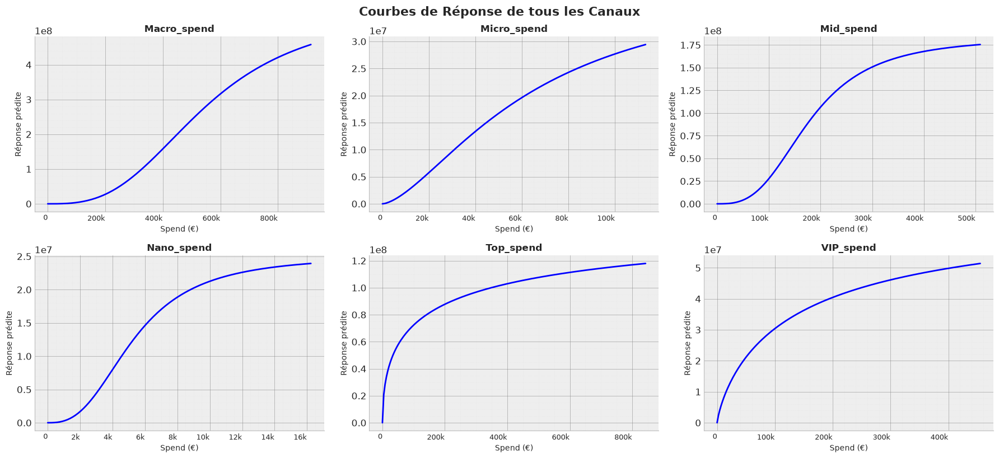

In [38]:
import math 
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker  


row_hyp_views = df_hyp_views.loc[df_hyp_views['best'].idxmax()]
df_agg_views = robyn_views.pareto_result.x_decomp_agg

channels = [col.replace('_alphas', '') for col in row_hyp_views.index if col.endswith('_alphas')]

n_channels = len(channels)
n_cols = 3
n_rows = math.ceil(n_channels / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, n_rows * 4))
axes = axes.flatten()

# Definition of the Hill response curve
def get_hill_curve(spend_array, alpha, gamma_abs, coef):
  numerator = spend_array**alpha
  denominator = (spend_array**alpha) + (gamma_abs**alpha)
  return coef * (numerator / (denominator + 1e-9))
  #--------------------------------------------

channel_to_tier = {v: k for k, v in tier_to_channel.items()}


for i, channel in enumerate(channels):
  ax = axes[i]

  # Retrives coefficients for each tiers
  alpha_views = row_hyp_views[f'{channel}_alphas']
  gamma_pct_views = row_hyp_views[f'{channel}_gammas']

  coef_row_views = df_agg_views[
      (df_agg_views['sol_id'] == best_model_views['sol_id'])
      & (df_agg_views['rn'] == channel)
  ]
  if coef_row_views.empty:
    continue
  coef_views = coef_row_views['coef'].values[0]
  # -------------------------------------------


  tier_name = channel_to_tier.get(channel)
  tier_row = tiers_data[tiers_data['tier'] == tier_name]


  # Compute the response curve for each tier on the maximum spend week
  if not tier_row.empty:
    max_spend = tier_row['max_spend'].values[0]
  else:
    max_spend = 50000

  gamma_abs_views = gamma_pct_views * max_spend

  spends = np.linspace(0, max(max_spend * 1.5, 10000), 200)
  response = get_hill_curve(spends, alpha_views, gamma_abs_views, coef_views)
  #--------------------------------------------


  ax.plot(spends, response, color='blue', linewidth=2)
  ax.set_title(f'{channel}', fontsize=12, weight='bold')
  ax.set_xlabel('Spend (€)', fontsize=10)
  ax.set_ylabel('Réponse prédite', fontsize=10)
  ax.grid(True, alpha=0.3)
  ax.minorticks_on()  
  ax.grid(True, which='major', linestyle='-', linewidth=0.7, alpha=0.5, color='gray') 
  ax.grid(True, which='minor', linestyle=':', linewidth=0.5, alpha=0.3, color='lightgray') 
  ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f'{x*1e-6:.1f}M' if x >= 1e6 else f'{int(x*1e-3)}k' if x >= 1e3 else str(int(x))))
  plt.setp(ax.get_xticklabels(), rotation=0, ha='right', fontsize=9)


for j in range(i + 1, len(axes)):
  fig.delaxes(axes[j])

plt.tight_layout()
plt.suptitle(
    'Courbes de Réponse de tous les Canaux',
    fontsize=16,
    y=1.02,
    weight='bold',
)
plt.show()


# Data preparation for optimisation

In [39]:
import io

#data extracted for quick optimization
data = """tier	nb_createurs_uniques	total_spent_eur	total_eng	total_views	total_posts_delivered	median_cost_per_post	avg_engagement_rate	CPE_global	CPV_global	max_spend	alpha_eng	gamma_pct_eng	theta_eng	coef_eng	alpha_views	gamma__pct_views	theta_views	coef_views
0	1-Nano	842	491526.5254	853693	703391270	4065	150.0000	0.1152	0.5758	0.0007	8355.4262	0.5772	0.9481	0.1022	0.0000	2.7647	0.8964	0.0310	47123604.6382
1	2-Micro	2820	4589812.5208	9329295	4660067729	20173	334.5810	0.0561	0.4920	0.0010	77673.1201	2.6511	0.8737	0.1288	1242559.4712	2.4488	0.9000	0.0641	61435924.6576
2	3-Mid	4967	23631269.5895	51342047	16356437017	34220	815.5998	0.0331	0.4603	0.0014	354422.7009	2.9600	0.9886	0.0364	5140933.7202	2.9142	0.9296	0.0253	564673077.6512
3	4-Macro	3877	43443241.4540	122943328	24599524749	32813	1585.4522	0.0237	0.3534	0.0018	603920.4694	1.2090	0.8495	0.1022	2700989.6759	2.2594	0.8746	0.1516	420138592.8376
4	5-Top	1902	44509516.7443	193502893	18290012409	19627	2882.6403	0.0177	0.2300	0.0024	529709.0396	1.1624	0.6997	0.1127	2206168.7999	0.6679	0.5544	0.2409	180148548.2118
5	6-VIP	293	16075206.8107	116089545	4366960626	3165	5260.8186	0.0125	0.1385	0.0037	309631.2278	2.6354	0.9652	0.1519	2464692.8004	0.7204	0.7462	0.1229	73663706.3358"""

# Converting to DataFrame Pandas 
df_tiers_params = pd.read_csv(io.StringIO(data), sep="\t")

df_tiers_params.head(6)


,tier,nb_createurs_uniques,total_spent_eur,total_eng,total_views,total_posts_delivered,median_cost_per_post,avg_engagement_rate,CPE_global,CPV_global,max_spend,alpha_eng,gamma_pct_eng,theta_eng,coef_eng,alpha_views,gamma__pct_views,theta_views,coef_views
0,1-Nano,842,491526.5254,853693,703391270,4065,150.0000,0.1152,0.5758,0.0007,8355.4262,0.5772,0.9481,0.1022,0.0000,2.7647,0.8964,0.0310,47123604.6382
1,2-Micro,2820,4589812.5208,9329295,4660067729,20173,334.5810,0.0561,0.4920,0.0010,77673.1201,2.6511,0.8737,0.1288,1242559.4712,2.4488,0.9000,0.0641,61435924.6576
2,3-Mid,4967,23631269.5895,51342047,16356437017,34220,815.5998,0.0331,0.4603,0.0014,354422.7009,2.9600,0.9886,0.0364,5140933.7202,2.9142,0.9296,0.0253,564673077.6512
3,4-Macro,3877,43443241.4540,122943328,24599524749,32813,1585.4522,0.0237,0.3534,0.0018,603920.4694,1.2090,0.8495,0.1022,2700989.6759,2.2594,0.8746,0.1516,420138592.8376
4,5-Top,1902,44509516.7443,193502893,18290012409,19627,2882.6403,0.0177,0.2300,0.0024,529709.0396,1.1624,0.6997,0.1127,2206168.7999,0.6679,0.5544,0.2409,180148548.2118
5,6-VIP,293,16075206.8107,116089545,4366960626,3165,5260.8186,0.0125,0.1385,0.0037,309631.2278,2.6354,0.9652,0.1519,2464692.8004,0.7204,0.7462,0.1229,73663706.3358


Avec les données calculées

In [53]:
df_tiers_params = tiers_data

# Optimizer

### Visualisation of reference points in 3 dimensional space 

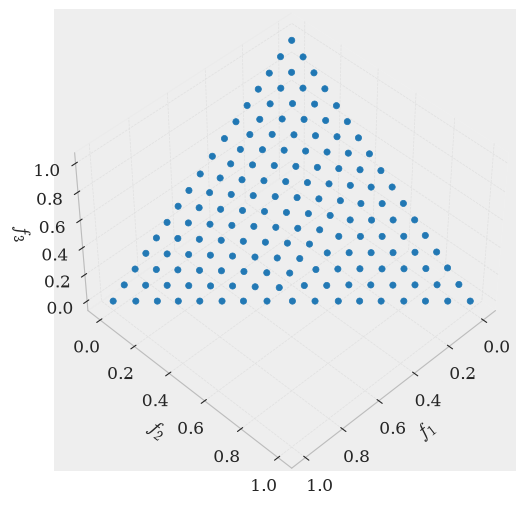

In [54]:
from pymoo.util.ref_dirs import get_reference_directions
from pymoo.visualization.scatter import Scatter

ref_dirs = get_reference_directions("energy", 3, 160, seed=1)

Scatter().add(ref_dirs).show()

## Retrieving all coefficients from MMM for optimization

In [55]:
tiers_names = df_tiers_params['tier'].tolist()
num_tiers = len(tiers_names)

# KPIs calculated on aggregated performance
unit_costs = df_tiers_params['median_cost_per_post'].to_numpy()
unit_eng_rate = df_tiers_params['avg_engagement_rate'].to_numpy()


# Extracting coefficients for the views
alpha_views = df_tiers_params['alpha_views'].to_numpy()
gamma_views_abs = (df_tiers_params['gamma__pct_views'].to_numpy()* df_tiers_params['max_spend']) 
coef_views = df_tiers_params['coef_views'].to_numpy()
theta_views = df_tiers_params['theta_views'].to_numpy()

# Extracting coefficients for the engagements
alpha_eng = df_tiers_params['alpha_eng'].to_numpy()
gamma_eng_abs = (df_tiers_params['gamma_pct_eng'].to_numpy()* df_tiers_params['max_spend'])
coef_eng = df_tiers_params['coef_eng'].to_numpy()
theta_eng = df_tiers_params['theta_eng'].to_numpy()

#Formatting to numpy table
coef_views = np.asarray(coef_views)
alpha_views = np.asarray(alpha_views)
gamma_views_abs = np.asarray(gamma_views_abs)

coef_eng = np.asarray(coef_eng)
alpha_eng = np.asarray(alpha_eng)
gamma_eng_abs = np.asarray(gamma_eng_abs)



CAMPAIGN_BUDGET = 100000.0  
CAMPAIGN_WEEKS = 4

## Structure of the optimizer

In [56]:
class TierPortfolioProblem(Problem):
    def __init__(self, campaign_budget=80000.0, selected_tiers=None, custom_caps=None):
        """
        campaign_budget : Le budget total alloué à la campagne (ex: 71000.0, 80000.0).
                          Par défaut à 80 000.0 €.

        selected_tiers : liste des tiers à optimiser (ex: ['1-Nano', '4-Macro', '6-VIP']).
                         Si None ou vide, tous les tiers de 'tiers_names' sont sélectionnés.
                         
         custom_caps    : dictionnaire contenant les limites maximales par tier.
                         Ex: {'1-Nano': 0.05, '2-Micro': 0.10, ...}
                         Si None, utilise les valeurs par défaut du marché.
        """

        self.campaign_budget = float(campaign_budget)
        self.all_tiers = list(tiers_names) 
        
        if selected_tiers is None or len(selected_tiers) == 0:
            self.active_tiers = self.all_tiers
        else:
            self.active_tiers = [t for t in selected_tiers if t in self.all_tiers]
        
        #Reference values for caps, maybe put the historical shares?
        default_caps = {
            '1-Nano': 0.16,   
            '2-Micro': 0.16, 
            '3-Mid': 0.16,   
            '4-Macro': 0.16,   
            '5-Top': 0.16,   
            '6-VIP': 0.16     
        }
        
        # If budget caps per tiers are provided, we update them
        self.caps = default_caps.copy()
        if custom_caps is not None:
            for tier_name, cap_value in custom_caps.items():
                if tier_name in self.caps:
                    self.caps[tier_name] = cap_value


        n_var = len(self.active_tiers)
        
        super().__init__(
            n_var=n_var,                  # only the number of tiers selected for optimization
            n_obj=6,                      # our 6 objective functions (the constraint is treated as an optimization function)
            n_ieq_constr=0,
            xl=0.01,
            xu=1.0
        )

    # Definition of the evaluation functions for every objective
    def _evaluate(self, x_pop, out, *args, **kwargs):
        num_solutions = x_pop.shape[0]
        fitness_results = np.zeros((num_solutions, 6))

        for idx in range(num_solutions):
            # x_raw is the vector for all active tiers
            x_raw = x_pop[idx].copy()
            
            # STEP A : Construction of the decision vector for all 6 tiers
            x_full = np.zeros(len(self.all_tiers))
            
            for active_idx, t_name in enumerate(self.active_tiers):
                global_idx = self.all_tiers.index(t_name)
                x_full[global_idx] = x_raw[active_idx]
            
            # STEP B : Normalization into a 100% sum vector
            sum_x = np.sum(x_full)
            if sum_x > 0:
                x_full = x_full / sum_x
            else:
                for t_name in self.active_tiers:
                    global_idx = self.all_tiers.index(t_name)
                    x_full[global_idx] = 1.0 / len(self.active_tiers)

            # Using caps for each tiers (has an impact but if the resulting optimization is not good it will adjust by itself)
            for _ in range(3):
                total_allocated = 0.0
                unlocked_indices = []
                
                for t_idx, t_name in enumerate(self.all_tiers):
                    # If tiers are not active they will not receive any budget
                    if t_name not in self.active_tiers:
                        x_full[t_idx] = 0.0
                        continue
                        
                    cap_value = next((val for key, val in caps.items() if key in t_name), 1.0)
                    
                    if x_full[t_idx] > cap_value:
                        x_full[t_idx] = cap_value
                    else:
                        unlocked_indices.append(t_idx)
                        
                    total_allocated += x_full[t_idx]
                

                # If there is remaining budget, it is redistributed to other tiers
                slack = 1.0 - total_allocated
                if abs(slack) < 1e-5 or not unlocked_indices:
                    break
                x_full[unlocked_indices] += slack / len(unlocked_indices)
                x_full = np.maximum(x_full, 0.0)
                #------------------------------

            # Step D: Final splits are updated
            for active_idx, t_name in enumerate(self.active_tiers):
                global_idx = self.all_tiers.index(t_name)
                x_raw[active_idx] = x_full[global_idx]
            
            x_pop[idx] = x_raw

            # STEP E : Definition of the evaluation functions
            budget_per_tier = x_full * self.campaign_budget  #We calculate the budget per tier
            posts_per_tier = budget_per_tier / (unit_costs + 1e-9) #How much posts can we buy per tier (for ER)
            total_posts = np.sum(posts_per_tier)

            # Calculation of global ER
            if total_posts > 0:
                portfolio_eng_rate = np.sum(posts_per_tier * unit_eng_rate) / total_posts
            else:
                portfolio_eng_rate = 0.0
            #-------------------------


            # Calculation of global views & engagements
            weekly_spend = budget_per_tier / CAMPAIGN_WEEKS
            n_weeks = CAMPAIGN_WEEKS
            matrix_weekly_spend = np.outer(weekly_spend, np.ones(n_weeks)) 

            #Matrices for adstocking views & engagement
            matrix_spend_ads_views = np.zeros_like(matrix_weekly_spend)
            matrix_spend_ads_eng = np.zeros_like(matrix_weekly_spend)


            for t_idx in range(len(self.all_tiers)):
                accum_v = 0.0
                for w in range(n_weeks):
                    accum_v = (matrix_weekly_spend[t_idx, w] + theta_views[t_idx] * accum_v)  
                    matrix_spend_ads_views[t_idx, w] = accum_v

                accum_e = 0.0
                for w in range(n_weeks):
                    accum_e = (matrix_weekly_spend[t_idx, w] + theta_eng[t_idx] * accum_e)  
                    matrix_spend_ads_eng[t_idx, w] = accum_e
            

            weekly_views = coef_views[:, None] * ((matrix_spend_ads_views**alpha_views[:, None])/((matrix_spend_ads_views**alpha_views[:, None])+(gamma_views_abs[:, None] ** alpha_views[:, None])+ 1e-9))
            portfolio_views = np.sum(weekly_views)  # Sum of all evaluations of weekly views from Hill functions

            weekly_eng = coef_eng[:, None] * ((matrix_spend_ads_eng**alpha_eng[:, None])/((matrix_spend_ads_eng**alpha_eng[:, None])+ (gamma_eng_abs[:, None] ** alpha_eng[:, None])+ 1e-9))
            portfolio_engagements = np.sum(weekly_eng) # Sum of all evaluations of weekly engagements from Hill functions
            #--------------------------------

            #Constraint
            portfolio_cost = np.sum(budget_per_tier)
            budget_deviation = abs(portfolio_cost - self.campaign_budget)
            #-------------------------------------

            #Evaluation of CPE & CPV
            portfolio_cpe = (portfolio_cost / portfolio_engagements if portfolio_engagements > 0 else 999)
            portfolio_cpv = (portfolio_cost / portfolio_views if portfolio_views > 0 else 999)
            #--------------------------------

            fitness_results[idx, 0] = budget_deviation
            fitness_results[idx, 1] = -portfolio_views  # À maximiser
            fitness_results[idx, 2] = -portfolio_engagements  # À maximiser
            fitness_results[idx, 3] = -portfolio_eng_rate  # À maximiser
            fitness_results[idx, 4] = portfolio_cpe  # À minimiser
            fitness_results[idx, 5] = portfolio_cpv  # À minimiser
               
            
        out["F"] = fitness_results

## Arguments for NSGA3

In [59]:
budget = 100000

selection = ['1-Nano','2-Micro','3-Mid','4-Macro','5-Top', '6-VIP']
caps = {      
    '1-Nano': 0.05,
    '2-Micro': 0.15,
    '3-Mid': 0.15,
    '4-Macro': 0.20,
    '5-Top': 0.40,    
    '6-VIP': 0.30        
}

ref_dirs = get_reference_directions("energy", 6, n_points=160)  

problem = TierPortfolioProblem(campaign_budget = budget, selected_tiers=selection,custom_caps=caps)

algorithm = NSGA3(
    ref_dirs=ref_dirs,
    sampling=FloatRandomSampling(),
    crossover=SBX(prob=0.9, eta=20),
    mutation=PM(prob=0.9, eta=20),
    pop_size=80,
)

res = minimize(problem, algorithm, termination=('n_gen', 150), seed=42)

This might cause unwanted behavior of the algorithm. 
Please make sure pop_size is equal or larger than the number of reference directions. 


In [60]:
X_opt = res.X       #Optimized genes (final tiering) are in this structure
F_opt = res.F       #Optimized performances are in this structure

results_list = []

for idx in range(len(X_opt)):
    
    x_opt = X_opt[idx].copy()
    x_opt = x_opt / np.sum(x_opt) 
    
    fitness = F_opt[idx]
    
    cost_spent = problem.campaign_budget - fitness[0]
    expected_views = -fitness[1]
    expected_eng = -fitness[2]
    expected_eng_rate = -fitness[3]
    portfolio_cpe = fitness[4]
    portfolio_cpv = fitness[5]
    
    solution_dict = {
        "Strategy_ID": idx + 1,
        "Total_Spent_EUR": cost_spent,
        "Expected_Views": f"{expected_views:.0f}",
        "Expected_Engagements": f"{expected_eng:.0f}",
        "Engagement_Rate_Global": f"{expected_eng_rate * 100:.2f}%",
        "Estimated_CPE_Global": portfolio_cpe,
        "Estimated_CPV_Global" : portfolio_cpv
    }
    
    
    for t_idx, t_name in enumerate(selection):
        solution_dict[f"Budget_{t_name}"] = f"{x_opt[t_idx] * 100:.1f}%"
        
    results_list.append(solution_dict)

df_strategies = pd.DataFrame(results_list)
df_strategies

,Strategy_ID,Total_Spent_EUR,Expected_Views,Expected_Engagements,Engagement_Rate_Global,Estimated_CPE_Global,Estimated_CPV_Global,Budget_1-Nano,Budget_2-Micro,Budget_3-Mid,Budget_4-Macro,Budget_5-Top,Budget_6-VIP
0,1,100000.0000,156088895,192249,6.92%,0.5202,0.0006,4.9%,15.3%,0.6%,0.7%,44.3%,34.2%
1,2,100000.0000,154180367,220269,6.82%,0.4540,0.0006,4.4%,6.1%,0.5%,13.4%,41.3%,34.3%
2,3,100000.0000,154940660,207548,6.68%,0.4818,0.0006,4.5%,13.9%,0.5%,10.1%,40.3%,30.7%
3,4,100000.0000,153776975,235281,6.94%,0.4250,0.0007,5.0%,0.5%,0.4%,20.1%,40.0%,34.0%
4,5,100000.0000,155949023,196321,6.86%,0.5094,0.0006,3.8%,18.6%,0.4%,3.5%,43.7%,30.0%
5,6,100000.0000,154089575,236392,6.94%,0.4230,0.0006,5.0%,0.5%,0.4%,20.1%,40.0%,34.0%
6,7,100000.0000,154096663,218938,6.89%,0.4568,0.0006,4.8%,0.6%,0.6%,10.3%,43.8%,40.0%
7,8,100000.0000,153780626,235281,6.94%,0.4250,0.0007,5.0%,0.4%,0.4%,20.1%,40.0%,34.0%
